In [1]:
from sstadex import Macromodel, Primitive, Test, dfs, simplediffpair, cs_pmos, cm_pmos, spice_sim, diffpair_cc, current_mirror_cc
import numpy as np
from sympy import Symbol
from sympy.solvers import solve
import matplotlib.pyplot as plt
import paretoset as pareto
import pandas as pd
from sympy import lambdify
from sstadex import Transistor
import seaborn as sns
sns.set_theme()
sns.color_palette("mako")

import sys

sys.path.insert(0, "../../..")
from gmid.mosplot import load_lookup_table, LoadMosfet

In [5]:
## Exploration parameters

N_points = 10
lengths_nmos = [0.45e-06, 0.8e-06, 1.6e-06, 3.2e-06, 6.4e-6]
lengths_pmos = [0.4e-06, 0.8e-06, 1.6e-06, 3.2e-06, 6.4e-6]

## Electrical parameters

Vout = 1.2                                      # LDO output voltage
Vin = 1.8                                       # LDO supply voltage
Vref = 0.9                                      # LDO voltage reference
IL = 100e-3                                     # Load current
CL = 0.5e-12                                    # Load capacitance
RL = Vout/IL

## LDO specifications

efficiency = 0.99
psrr_condition = -70
estability_condition = 60
linereg_condition = 0.5
loadreg_condition = 0.7
#iq_condition = 20e-6
size_condition = 1e-3

I_bias = 5e-6
I_amp1 = 40e-6 # considering the two branches of differential pair
I_amp2 = 40e-6

Iq_max = IL*(1-efficiency)
Ib_pt = Iq_max-I_amp1-I_amp2-I_bias

R1 = (Vout-Vref)/Ib_pt
R2 = Vref*R1/(Vout-Vref)

LDO = pd.DataFrame.from_dict({'Vout': [Vout], 'Vin': [Vin], 'Vref': [Vref], 'IL': [IL], 'CL': [CL], 'RL': [RL], 'Iq_max': [Iq_max], 'Ib_pt': [Ib_pt], 'R1': [R1], 'R2': [R2]}, orient='index', columns=['Value'])
LDO

,Value
Vout,1.200000e+00
Vin,1.800000e+00
Vref,9.000000e-01
IL,1.000000e-01
CL,5.000000e-13
RL,1.200000e+01
Iq_max,1.000000e-03
Ib_pt,9.150000e-04
R1,3.278689e+02
R2,9.836066e+02


# Pre-exploration

## Macromodels

In [ ]:
V2stage_out = np.linspace(Vout-Vin+0.5, Vout-Vin-0.8, N_points)

LDO_macro = Macromodel(
    name ='LDO_macro', 
    outputs= [
        Symbol("W_pt"), Symbol("L_pt"),
        Symbol("W_cc"), Symbol("L_cc"),
        Symbol("W_rc"), Symbol("L_rc")],
    electrical_parameters={
        "Vdd": Vin, 
        "Vref": Vref, 
        "Vout": Vout, 
        "V2stage_out": V2stage_out,
        "Il": IL+Ib_pt}
    )

LDO_macro.area_conditions = {
    "max": [100e-3, 100e-3, 100e-3, 100e-3, 100e-3, 100e-3, 10, 100e-3, 100e-3, 100e-3, 100e-3, 100e-3, 100e-3],
    "min": [5e-6, 0, 0, 5e-6, 0, 0, ]}

V1stage_out = np.linspace(1-0.3, 1+0.6, 5)

OTA_macro = Macromodel(
    name = 'OTA_macro',
    outputs = [
        Symbol("W_2stage"), Symbol("L_2stage"),
        Symbol("vin_2stage"),
        Symbol('W_cs_2stage'), Symbol('L_cs_2stage'),
        Symbol('vgs_cs_2stage'),
        Symbol("W_diff"), Symbol("L_diff"), 
        Symbol("vout_1stage"),
        Symbol("W_al"), Symbol("L_al"),
        Symbol("W_cs"), Symbol("L_cs"),
        Symbol('vgs_cs'),
        Symbol("W_cc"), Symbol("L_cc"),
        Symbol("W_rc"), Symbol("L_rc")],
    electrical_parameters = {
        "Vdd": LDO_macro.electrical_parameters["Vdd"],
        "Vref": LDO_macro.electrical_parameters["Vref"],
        "Vout": LDO_macro.electrical_parameters["V2stage_out"],
        "V1stage_out": V1stage_out,
        "Il": I_amp2},
    macromodel_parameters={
        Symbol('Ra'): np.logspace(3, 7, N_points),
        Symbol('gma'): np.logspace(-5, -2, N_points)}
    )

OTA_macro.area_conditions = {
    "max": [10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10],
    "min": [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]}

OTA_2stage_macro = Macromodel(
    name = 'OTA_2stage_macro',
    outputs = [
        Symbol("W_2stage"), Symbol("L_2stage"),
        Symbol("vin_2stage"),
        Symbol('W_cs_2stage'), Symbol('L_cs_2stage'),
        Symbol('vgs_cs_2stage')],
    electrical_parameters = {
        "Vdd": OTA_macro.electrical_parameters["Vdd"],
        "Vin": OTA_macro.electrical_parameters["V1stage_out"],
        "Vout": OTA_macro.electrical_parameters["Vout"],
        "Il": I_amp2},
    macromodel_parameters={
        Symbol('Ra_2stage'): np.logspace(3, 7, 5),
        Symbol('gma_2stage'): np.logspace(-5, -2, 5),
        Symbol('Cin_2stage'): np.logspace(-16, -11, 5)}
    )

OTA_2stage_macro.area_conditions = {
    "max": [2e-4, 2e-4, 10, 2e-4, 2e-4, 10],
    "min": [5e-6, 0, 0, 5e-6, 0, 0]}

OTA_1stage_macro = Macromodel(
    name = 'OTA_1stage_macro',
    outputs = [
        Symbol("W_diff"), Symbol("L_diff"), 
        Symbol("vout_1stage"),
        Symbol("W_al"), Symbol("L_al"),
        Symbol("W_cs"), Symbol("L_cs"),
        Symbol('vgs_cs')],
    electrical_parameters = {
        "Vdd": OTA_macro.electrical_parameters["Vdd"],
        "Vref": OTA_macro.electrical_parameters["Vref"],
        "Vout": OTA_macro.electrical_parameters["V1stage_out"],
        "Il": I_amp1},
    macromodel_parameters={
        Symbol('Ra_1stage'): np.logspace(3, 7, N_points),
        Symbol('gma_1stage'): np.logspace(-5, -2, N_points)}
    ) 

OTA_1stage_macro.area_conditions = {
    "max": [2e-4, 2e-4, 10, 2e-4, 2e-4, 2e-4, 2e-4, 10],
    "min": [5e-6, 0, 5e-6, 0, 0, 5e-6, 0, 0]}

## Testbenches

### LDO

In [7]:
psrr_LDO_macro = Test()
psrr_LDO_macro.name = "psrr_LDO"
psrr_LDO_macro.tf = ["vout", "vdd"]
psrr_LDO_macro.netlist = "ldo"
psrr_LDO_macro.parametros = {Symbol("V1"): 1,
                             Symbol("V2"): 0,
                             Symbol("s"): 0,
                             Symbol("Cl"): CL,
                             Symbol("Rl"): RL,
                             Symbol("R1"): R1, 
                             Symbol("R2"): R2}

psrr_LDO_macro.opt_goal = "min"
psrr_LDO_macro.conditions = {"max": [10**(100/20)]}
psrr_LDO_macro.variables = {}
psrr_LDO_macro.out_def = {"eval": psrr_LDO_macro.tf}

##############################################################################

dc_LDO_macro = Test()
dc_LDO_macro.name = "dc_LDO"
dc_LDO_macro.tf = ["vout", "vdd"]
dc_LDO_macro.netlist = "ldo"
dc_LDO_macro.parametros = {Symbol("V1"): Vin,
                           Symbol("V2"): Vref,
                           Symbol("s"): 0,
                           Symbol("Rl"): RL,
                           Symbol("Cl"): CL,
                           Symbol("R1"): R1, 
                           Symbol("R2"): R2}

dc_LDO_macro.opt_goal = "min"
dc_LDO_macro.conditions = {"min": [0]}
dc_LDO_macro.variables = {}
dc_LDO_macro.out_def = {"eval": dc_LDO_macro.tf}
x = Symbol("x")
dc_LDO_macro.lamd = lambdify(x, x*3.3)

##############################################################################

gain_ol_LDO_macro = Test()
gain_ol_LDO_macro.name = "gain_ol_LDO"
gain_ol_LDO_macro.tf = ["vout", "vol"]
gain_ol_LDO_macro.netlist = "ldo_ol"
gain_ol_LDO_macro.parametros = {Symbol("V1"): 0,
                             Symbol("V2"): 0,
                             Symbol("V3"): 1,
                             Symbol("s"): 0,
                             Symbol("C1"): 10,
                             Symbol("Cl"): CL,
                             Symbol("Rl"): RL,
                             Symbol("R1"): R1, 
                             Symbol("R2"): R2,
                             Symbol("R3"): 10000000000}

gain_ol_LDO_macro.opt_goal = "min"
gain_ol_LDO_macro.conditions = {"min": [1]}
gain_ol_LDO_macro.variables = {}
gain_ol_LDO_macro.out_def = {"eval": gain_ol_LDO_macro.tf}

##############################################################################

phase_margin_LDO_macro = Test()
phase_margin_LDO_macro.name = "phase_margin_LDO"
phase_margin_LDO_macro.tf = ["vout", "vol"]
phase_margin_LDO_macro.netlist = "ldo_ol"
phase_margin_LDO_macro.parametros = {Symbol("V1"): 0,
                             Symbol("V2"): 0,
                             Symbol("V3"): 1,
                             Symbol("C1"): 10,
                             Symbol("Cl"): CL,
                             Symbol("Rl"): RL,
                             Symbol("R1"): R1, 
                             Symbol("R2"): R2,
                             Symbol("R3"): 10000000000}

phase_margin_LDO_macro.opt_goal = "min"
phase_margin_LDO_macro.conditions = {"min": [-100]}
phase_margin_LDO_macro.variables = {}
phase_margin_LDO_macro.out_def = {"pm": phase_margin_LDO_macro.tf}

### OTA

In [8]:
gain_OTA = Test()
gain_OTA.name = "gain_OTA"
gain_OTA.tf = ["vout", "vpos"]
gain_OTA.netlist = "OpAmp_2stage"
gain_OTA.parametros = {
    Symbol("V1"): 0,
    Symbol("Vpos"): 1,
    Symbol("I_amp2"): 0,
    Symbol("s"): 0}

gain_OTA.opt_goal = "max"
gain_OTA.conditions = {"min": [10**(73.333/20)]}
gain_OTA.variables = {}
gain_OTA.out_def = {"eval": gain_OTA.tf}

#########################################################

phase_margin_OTA = Test()
phase_margin_OTA.name = "phase_margin_OTA"
phase_margin_OTA.tf = ["vout", "vpos"]
phase_margin_OTA.netlist = "OpAmp_2stage"
phase_margin_OTA.parametros = {
    Symbol("V1"): 0,
    Symbol("Vpos"): 1,
    Symbol("Cin_pt"): 2.5160347955371574e-11}

phase_margin_OTA.opt_goal = "min"
phase_margin_OTA.conditions = {"min": [-200]}
phase_margin_OTA.variables = {}
phase_margin_OTA.out_def = {"pm": phase_margin_OTA.tf}

##########################################################

rout_OTA = Test()
rout_OTA.name = "rout_OTA"
rout_OTA.target_param = Symbol("Ra")
rout_OTA.tf = ["vout", "vr"]
rout_OTA.netlist = "OpAmp_2stage_rout"
rout_OTA.parametros = {
    Symbol("Vpos"): 0,
    Symbol("Vr"): 1,
    Symbol("s"): 0,
    Symbol("Rr"): 1000,
    Symbol("Cin_pt"): 2.5160347955371574e-11}

rout_OTA.opt_goal = "max"
rout_OTA.conditions = {"min": [1]}
x = Symbol("x")
rout_OTA.lamd = lambdify(x, x*1000/(1-x))
rout_OTA.variables = {}
rout_OTA.out_def = {"eval": rout_OTA.tf}

##########################################################

gm_OTA = Test()
gm_OTA.target_param = Symbol("gma")
gm_OTA.name = "gm_OTA"
gm_OTA.tf = ["vout", "vpos"]
gm_OTA.netlist = "OpAmp_2stage"
gm_OTA.composed = 1
gm_OTA.out_def = {"divide": [gain_OTA, rout_OTA]}
gm_OTA.opt_goal = "max"
gm_OTA.conditions = {"min": [0.000000001]}

### OTA 1stage

In [9]:
gain_1stage_OTA = Test()
gain_1stage_OTA.tf = ("vout", "vpos")
gain_1stage_OTA.name = "gain_1stage"
gain_1stage_OTA.netlist = "ota_1stage"
gain_1stage_OTA.parametros = {
    Symbol("gdiff_2"): Symbol("gdiff_1"),
    Symbol("Rdiff_2"): Symbol("Rdiff_1"),
    Symbol("gaload_2"): Symbol("gaload_1"),
    Symbol("Raload_2"): Symbol("Raload_1"),
    Symbol("V1"): 0,
    Symbol("V_n"): 0,
    Symbol("V_p"): 1,
    Symbol("I2"): 0,
    Symbol("s"): 0}
gain_1stage_OTA.opt_goal = "max"
gain_1stage_OTA.conditions = {"min": [10**(-100/20)]}
gain_1stage_OTA.variables = {}
gain_1stage_OTA.out_def = {"eval": gain_1stage_OTA.tf}

##################################################################

psrr_1stage_OTA = Test()
psrr_1stage_OTA.tf = ("vout", "vdd")
psrr_1stage_OTA.name = "psrr_1stage"
psrr_1stage_OTA.netlist = "ota_1stage"
psrr_1stage_OTA.parametros = {
    Symbol("gdiff_2"): Symbol("gdiff_1"),
    Symbol("Rdiff_2"): Symbol("Rdiff_1"),
    Symbol("gaload_2"): Symbol("gaload_1"),
    Symbol("Raload_2"): Symbol("Raload_1"),
    Symbol("V1"): 1,
    Symbol("V_n"): 0,
    Symbol("V_p"): 0,
    Symbol("I2"): 0,
    Symbol("s"): 0}
psrr_1stage_OTA.opt_goal = "max"
psrr_1stage_OTA.conditions = {"min": [0.0000001]}
psrr_1stage_OTA.variables = {}
psrr_1stage_OTA.out_def = {"eval": psrr_1stage_OTA.tf}

##################################################################

rout_1stage_OTA = Test()
rout_1stage_OTA.name = "rout_1stage"
rout_1stage_OTA.target_param = Symbol("Ra_1stage")
rout_1stage_OTA.tf = ["vout", "vr"]
rout_1stage_OTA.netlist = "ota_1stage_rout"
rout_1stage_OTA.parametros = {Symbol("gdiff_2"): Symbol("gdiff_1"),
                              Symbol("Rdiff_2"): Symbol("Rdiff_1"),
                                Symbol("gaload_2"): Symbol("gaload_1"),
                                Symbol("Raload_2"): Symbol("Raload_1"),
                                Symbol("V1"): 0,
                                Symbol("V_n"): 0,
                                Symbol("V_p"): 0,
                                Symbol("Vr"): 1,
                                Symbol("I2"): 0,
                                Symbol("s"): 0,
                                Symbol("Rr"): 1000,
                                Symbol("Cl"): 1e-12}

rout_1stage_OTA.opt_goal = "max"
rout_1stage_OTA.conditions = {"min": [1]}
x = Symbol("x")
rout_1stage_OTA.lamd = lambdify(x, x*1000/(1-x))
rout_1stage_OTA.variables = {}
rout_1stage_OTA.out_def = {"eval": rout_1stage_OTA.tf}

##################################################################

gm_1stage_OTA = Test()
gm_1stage_OTA.target_param = Symbol("gma_1stage")
gm_1stage_OTA.name = "gm_1stage"
gm_1stage_OTA.tf = ["vout", "vpos"]
gm_1stage_OTA.netlist = "ota_1stage"
gm_1stage_OTA.composed = 1
gm_1stage_OTA.out_def = {"divide": [gain_1stage_OTA, rout_1stage_OTA]}
gm_1stage_OTA.opt_goal = "max"
gm_1stage_OTA.conditions = {"min": [9.999999999999999e-6]}

### OTA 2stage

In [10]:
gain_2stage_OTA = Test()
gain_2stage_OTA.tf = ("vout", "vin")
gain_2stage_OTA.name = "gain_2stage"
gain_2stage_OTA.netlist = "ota_2stage_v2"
gain_2stage_OTA.parametros = {
    Symbol("V1"): 0,
    Symbol("V2"): 1,
    Symbol("s"): 0,
    Symbol("Cin_pt"): 2.5160347955371574e-11}
gain_2stage_OTA.opt_goal = "max"
gain_2stage_OTA.conditions = {"min": [1]}
gain_2stage_OTA.variables = {}
gain_2stage_OTA.out_def = {"eval": gain_2stage_OTA.tf}

##################################################################

rout_2stage_OTA = Test()
rout_2stage_OTA.name = "rout_2stage"
rout_2stage_OTA.target_param = Symbol("Ra_2stage")
rout_2stage_OTA.tf = ["vout", "vr"]
rout_2stage_OTA.netlist = "ota_2stage_rout_v2"
rout_2stage_OTA.parametros = {Symbol("V1"): 0,
                              Symbol("V2"): 0,
                                Symbol("Vr"): 1,
                                Symbol("s"): 0,
                                Symbol("Rr"): 1000,
                                Symbol("Cin_pt"): 2.5160347955371574e-11}

rout_2stage_OTA.opt_goal = "max"
rout_2stage_OTA.conditions = {"min": [1]}
x = Symbol("x")
rout_2stage_OTA.lamd = lambdify(x, x*1000/(1-x))
rout_2stage_OTA.variables = {}
rout_2stage_OTA.out_def = {"eval": rout_2stage_OTA.tf}

##################################################################

gm_2stage_OTA = Test()
gm_2stage_OTA.target_param = Symbol("gma_2stage")
gm_2stage_OTA.name = "gm_2stage"
gm_2stage_OTA.tf = ["vout", "vin"]
gm_2stage_OTA.netlist = "ota_2stage_v2"
gm_2stage_OTA.composed = 1
gm_2stage_OTA.out_def = {"divide": [gain_2stage_OTA, rout_2stage_OTA]}
gm_2stage_OTA.opt_goal = "max"
gm_2stage_OTA.conditions = {"min": [0.000000001]}

## Primitives

### LDO

In [8]:
# CASE 1: WITH LOAD

pt = cs_pmos(
    netlist='pmos_cm.spice', 
    type='pmos', 
    inputs={
        'vds_lut': LDO_macro.electrical_parameters["Vout"]-LDO_macro.electrical_parameters["Vdd"], 
        'vgs_lut': (-2, -0.1, 0.01), 
        'vgs': LDO_macro.electrical_parameters["V2stage_out"], 
        'il': LDO_macro.electrical_parameters["Il"],
        'length': lengths_pmos, 
        '2d_var': ['length', 'vgs']})

pt.build()

pt.parameters = {
    Symbol('gm_pt'): np.asarray(pt.gm).flatten(),
    Symbol('Ro_pt'): np.asarray(pt.Ro).flatten(),
    Symbol("Cgg_pt"): np.asarray(pt.cgg).flatten(),
    Symbol("Cgd_pt"): np.asarray(pt.cgd).flatten(),
    Symbol("Cin_pt"): np.asarray(pt.cgg).flatten()+np.asarray(pt.cgd).flatten()*np.asarray(pt.gm).flatten()*np.asarray(pt.Ro).flatten(),
    Symbol("dropout"): 2/(np.asarray(pt.gm).flatten()/pt.inputs['il']),
    Symbol('vout_2stage'): np.tile(LDO_macro.electrical_parameters["V2stage_out"], 5)}

pt.outputs = {
    Symbol("W_pt"): np.asarray(pt.W).flatten(),
    Symbol("L_pt"): np.asarray(pt.L).flatten()}

# CASE 2: WITHOUT LOAD

## found operation point of the circuit with no load
lookup_table = load_lookup_table('../../LUTs/IHP_LUT_hv_20w.npy')

pt_lutable = LoadMosfet(
            lookup_table=lookup_table,
            mos='pmos',
            vsb=0,
            vds=LDO_macro.electrical_parameters["Vout"]-LDO_macro.electrical_parameters["Vdd"],
            vgs=(-2.5, -0.1, 0.01),
            lengths=lengths_pmos,
        )

jd_2 = Ib_pt/pt.W.flatten()

vgs_2 = pt_lutable.interpolate(
            x_expression=pt_lutable.current_density_expression,
            x_value=jd_2,
            y_expression=pt_lutable.lengths_expression,
            y_value=pt.L.flatten(),
            z_expression=pt_lutable.vgs_expression,
        )

vgs_2 = np.diag(vgs_2)
print("Values of Vgs_pt when there is no load: ", vgs_2)
##

vout_2stage_wc = vgs_2

pt_wc = cs_pmos(
    netlist='pmos_cm.spice', 
    type='pmos', 
    inputs={
        'vds_lut': LDO_macro.electrical_parameters["Vout"]-LDO_macro.electrical_parameters["Vdd"], 
        'vgs_lut': (-2, -0.1, 0.01), 
        'vgs': vout_2stage_wc, 
        'il': Ib_pt,
        'length': pt.L.flatten(), 
        '2d_var': ['length', 'vgs']})

pt_wc.build()

pt_wc.parameters = {
    Symbol('gm_pt'): np.asarray(pt_wc.gm.diagonal()).flatten(),
    Symbol('Ro_pt'): np.asarray(pt_wc.Ro.diagonal()).flatten(),
    Symbol("Cgg_pt"): np.asarray(pt_wc.cgg.diagonal()).flatten(),
    Symbol("Cgd_pt"): np.asarray(pt_wc.cgd.diagonal()).flatten(),
    Symbol("dropout"): 2/(np.asarray(pt_wc.gm.diagonal()).flatten()/pt_wc.inputs['il']),
    Symbol("Cin_pt"): np.asarray(pt_wc.cgg.diagonal()).flatten()+np.asarray(pt_wc.cgd.diagonal()).flatten()*np.asarray(pt_wc.gm.diagonal()).flatten()*np.asarray(pt_wc.Ro.diagonal()).flatten(),
    Symbol('vout_2stage'): vout_2stage_wc}

pt_wc.outputs = {
    Symbol("W_pt"): np.asarray(pt.W).flatten(),
    Symbol("L_pt"): np.asarray(pt.L).flatten()}

length
vgs
0
Values of Vgs_pt when there is no load:  [        nan         nan -0.21175239 -0.34939443         nan -0.50666816
 -0.54479269 -0.5740396  -0.59794335 -0.61800759         nan         nan
 -0.139906   -0.34571088 -0.4643637  -0.532253   -0.57473708 -0.60608156
 -0.63144418 -0.65286868         nan         nan -0.1155049  -0.34312938
 -0.46899513 -0.54121614 -0.58542056 -0.61763201 -0.64370458 -0.66596659
         nan         nan -0.10810057 -0.35508006 -0.4707689  -0.54458477
 -0.58945945 -0.62204598 -0.64844888 -0.67114206         nan         nan
 -0.10534456 -0.30079744 -0.471492   -0.54587748 -0.59101215 -0.62376149
 -0.65031442 -0.67321482]
length
vgs
0


In [9]:
LDO_macro.electrical_parameters["V2stage_out"][7]

np.float64(-1.1111111111111114)

In [10]:
vout_2stage_wc[7]

np.float64(-0.5740396035819006)

### OTA

In [11]:
vs = np.linspace(0.3, 0.8, 5)

Cc = np.logspace(-13, -10, 3)
Rc = np.logspace(3, 4, 3)

mesh = np.meshgrid(Cc, Rc)

Cc_primitive = Primitive(parameters={Symbol("Cc"): mesh[0].flatten(),
                                     Symbol("Rc"): mesh[1].flatten()})
Cc_primitive.outputs = {
    Symbol("W_cc"): np.sqrt(Cc_primitive.parameters[Symbol("Cc")]/1.5e-15)*1e-6,
    Symbol("L_cc"): np.sqrt(Cc_primitive.parameters[Symbol("Cc")]/1.5e-15)*1e-6,
    Symbol("W_rc"): np.sqrt(Cc_primitive.parameters[Symbol("Rc")]/(1360*0.5))*1e-6,
    Symbol("L_rc"): np.repeat(0.5e-6, len(mesh[0].flatten()))}

### OTA 1stage

In [12]:
vds_diffpar = []
for vds in OTA_1stage_macro.electrical_parameters["Vout"]:
    vds_diffpar.append(vds-vs)

vgs_diffpar = OTA_1stage_macro.electrical_parameters["Vref"] - vs

vds_diffpar = np.asarray(vds_diffpar).flatten()
vgs_diffpar = np.tile(vgs_diffpar, len(OTA_1stage_macro.electrical_parameters["Vout"]))
print(vds_diffpar)
print(vgs_diffpar)

[ 0.4    0.275  0.15   0.025 -0.1    0.625  0.5    0.375  0.25   0.125
  0.85   0.725  0.6    0.475  0.35   1.075  0.95   0.825  0.7    0.575
  1.3    1.175  1.05   0.925  0.8  ]
[0.6   0.475 0.35  0.225 0.1   0.6   0.475 0.35  0.225 0.1   0.6   0.475
 0.35  0.225 0.1   0.6   0.475 0.35  0.225 0.1   0.6   0.475 0.35  0.225
 0.1  ]


In [13]:
diffpair = simplediffpair(
    netlist='diffpair.spice',
    type='nmos',
    inputs = { 
        'vds_lut': (0.1, 2, 0.01),
        'vgs_lut': (0.1, 2.2, 0.01), 
        'vds': vds_diffpar, 
        'vgs': vgs_diffpar, 
        'il': I_amp1/2,
        'length': lengths_nmos, 
        '2d_var': ['vds', 'vgs']}
)

diffpair.build()

diffpair.parameters = {
    Symbol('gdiff_1'): np.asarray(diffpair.gm).flatten(),
    Symbol('Rdiff_1'): np.asarray(diffpair.Ro).flatten(),
    Symbol("vs_diff"): np.tile(np.tile(np.asarray(vs), len(OTA_1stage_macro.electrical_parameters["Vout"])), len(lengths_nmos))}

diffpair.outputs = {
    Symbol("W_diff"): np.asarray(diffpair.W).flatten(),
    Symbol("L_diff"): np.asarray(diffpair.L).flatten(),
    Symbol("vout_1stage"): np.tile(np.repeat(OTA_1stage_macro.electrical_parameters["Vout"], len(vs)), 5)}

##############################################################################

activeload = cm_pmos(
    netlist='pmos_cs.spice',
    type='pmos',
    inputs={
        'vds_lut': (-1.7, -0.1, 0.01), 
        'vgs_lut': (-1.8, -0.1, 0.01), 
        'vds': OTA_1stage_macro.electrical_parameters["Vout"]-OTA_1stage_macro.electrical_parameters["Vdd"],
        'vgs': OTA_1stage_macro.electrical_parameters["Vout"]-OTA_1stage_macro.electrical_parameters["Vdd"], 
        'il': I_amp1/2,
        'length': lengths_pmos, 
        '2d_var': ['vds', 'vgs']})

activeload.build()

activeload.parameters = {
    Symbol('gaload_1'): np.asarray(activeload.gm).flatten(),
    Symbol('Raload_1'): np.asarray(activeload.Ro).flatten(),
    Symbol('vout_aload'): np.tile(OTA_1stage_macro.electrical_parameters["Vout"], 5)}

activeload.outputs = {
    Symbol("W_al"): np.asarray(activeload.W).flatten(),
    Symbol("L_al"): np.asarray(activeload.L).flatten()}

#############################################################################

currentsource = cm_pmos()
currentsource.parameters = {
    Symbol('gcs'): [],
    Symbol('Rcs'): [],
    Symbol('vs_cs'): [],
    Symbol('vgs_cs'): []}
currentsource.outputs = {
    Symbol("W_cs"): [],
    Symbol("L_cs"): []}


stage2_cs = cm_pmos()
stage2_cs.parameters = {
    Symbol('gcs_2stage'): [],
    Symbol('Rcs_2stage'): [],
    Symbol('vgs_cs_2stage'): []}
stage2_cs.outputs = {
    Symbol("W_cs_2stage"): [],
    Symbol("L_cs_2stage"): []}

for vds_cs in vs:

    vgs_cs = np.linspace(vds_cs-0.2, vds_cs+0.6, 5)

    currentsource_aux = cm_pmos(
        netlist='pmos_cs.spice',
        type='nmos',
        inputs={
            'vds_lut': vds_cs, 
            'vgs_lut': (0.1, 2, 0.01), 
            'vgs': vgs_cs, 
            'il': I_amp1,
            'length': lengths_nmos, 
            '2d_var': ['length', 'vgs']})
    currentsource_aux.build()

    currentsource.parameters[Symbol('gcs')].append(np.asarray(currentsource_aux.gm).flatten())
    currentsource.parameters[Symbol('Rcs')].append(np.asarray(currentsource_aux.Ro).flatten())
    currentsource.parameters[Symbol('vs_cs')].append(np.asarray(np.repeat(vds_cs, len(lengths_nmos)*len(vgs_cs))).flatten())
    currentsource.parameters[Symbol('vgs_cs')].append(np.asarray(np.tile(vgs_cs, len(lengths_nmos))).flatten())
    currentsource.outputs[Symbol('W_cs')].append(np.asarray(currentsource_aux.W).flatten())
    currentsource.outputs[Symbol('L_cs')].append(np.asarray(currentsource_aux.L).flatten())

    for vds_aux in [-1.11]:

        stage2_cs_aux = cm_pmos(
        netlist='pmos_cs.spice',
        type='nmos',
        inputs={
            'vds_lut': 1.8+vds_aux,
            'vgs_lut': (0.1, 2, 0.01),
            'vgs': vgs_cs,
            'il': OTA_2stage_macro.electrical_parameters['Il'],
            'length': lengths_nmos,
            '2d_var': ['length', 'vgs']}
            )
        stage2_cs_aux.build()
        
        stage2_cs.parameters[Symbol('gcs_2stage')].append(np.asarray(stage2_cs_aux.gm).flatten())
        stage2_cs.parameters[Symbol('Rcs_2stage')].append(np.asarray(stage2_cs_aux.Ro).flatten())
        stage2_cs.parameters[Symbol('vgs_cs_2stage')].append(np.asarray(np.tile(vgs_cs, len(lengths_nmos))).flatten())
        stage2_cs.outputs[Symbol('W_cs_2stage')].append(np.asarray(currentsource_aux.W).flatten())
        stage2_cs.outputs[Symbol('L_cs_2stage')].append(np.asarray(currentsource_aux.L).flatten())


currentsource.parameters[Symbol('gcs')] = np.asarray(currentsource.parameters[Symbol('gcs')]).flatten()
currentsource.parameters[Symbol('Rcs')] = np.asarray(currentsource.parameters[Symbol('Rcs')]).flatten()
currentsource.parameters[Symbol('vs_cs')] = np.asarray(currentsource.parameters[Symbol('vs_cs')]).flatten()
currentsource.parameters[Symbol('vgs_cs')] = np.asarray(currentsource.parameters[Symbol('vgs_cs')]).flatten()
currentsource.outputs[Symbol('W_cs')] = np.asarray(currentsource.outputs[Symbol('W_cs')]).flatten()
currentsource.outputs[Symbol('L_cs')] = np.asarray(currentsource.outputs[Symbol('L_cs')]).flatten()
currentsource.outputs[Symbol('vgs_cs')] = currentsource.parameters[Symbol('vgs_cs')]

stage2_cs.parameters[Symbol('gcs_2stage')]=np.asarray(stage2_cs.parameters[Symbol('gcs_2stage')]).flatten()
stage2_cs.parameters[Symbol('Rcs_2stage')]=np.asarray(stage2_cs.parameters[Symbol('Rcs_2stage')]).flatten()
stage2_cs.parameters[Symbol('vgs_cs_2stage')]=np.asarray(stage2_cs.parameters[Symbol('vgs_cs_2stage')]).flatten()
stage2_cs.outputs[Symbol('W_cs_2stage')]=np.asarray(stage2_cs.outputs[Symbol('W_cs_2stage')]).flatten()
stage2_cs.outputs[Symbol('L_cs_2stage')]=np.asarray(stage2_cs.outputs[Symbol('L_cs_2stage')]).flatten()
stage2_cs.outputs[Symbol('vgs_cs_2stage')]=np.asarray(stage2_cs.parameters[Symbol('vgs_cs_2stage')]).flatten()

vds
vgs
1
vds
vgs
1
length
vgs
0
length
vgs
0
length
vgs
0
length
vgs
0
length
vgs
0
length
vgs
0
length
vgs
0
length
vgs
0
length
vgs
0
length
vgs
0


In [230]:
OTA_1stage_macro.electrical_parameters["Vout"]

array([0.4, 0.7, 1. , 1.3, 1.6])

In [ ]:
1.8+vout_1stage_wc

array([0.35493882, 0.38213841, 0.39287498, 0.39652086, 0.39796233,
       0.68806499, 0.69646938, 0.69863094, 0.69920063, 0.69945504,
       0.99540742, 0.99886171, 0.99953375, 0.99972946, 0.99981944,
       1.29658349, 1.29927552, 1.29976609, 1.29988698, 1.2999302 ,
       1.60303073, 1.66524796, 1.68047883, 1.69126489, 1.6942409 ])

In [ ]:
diff_pair_l = np.tile(lengths_nmos)

vds_diffpar_wc = []
for vds in 1.8+vout_1stage_wc:
    vds_diffpar_wc.append(vds-vs)
vds_diffpar_wc

[array([ 0.05493882, -0.07006118, -0.19506118, -0.32006118, -0.44506118]),
 array([ 0.08213841, -0.04286159, -0.16786159, -0.29286159, -0.41786159]),
 array([ 0.09287498, -0.03212502, -0.15712502, -0.28212502, -0.40712502]),
 array([ 0.09652086, -0.02847914, -0.15347914, -0.27847914, -0.40347914]),
 array([ 0.09796233, -0.02703767, -0.15203767, -0.27703767, -0.40203767]),
 array([ 0.38806499,  0.26306499,  0.13806499,  0.01306499, -0.11193501]),
 array([ 0.39646938,  0.27146938,  0.14646938,  0.02146938, -0.10353062]),
 array([ 0.39863094,  0.27363094,  0.14863094,  0.02363094, -0.10136906]),
 array([ 0.39920063,  0.27420063,  0.14920063,  0.02420063, -0.10079937]),
 array([ 0.39945504,  0.27445504,  0.14945504,  0.02445504, -0.10054496]),
 array([0.69540742, 0.57040742, 0.44540742, 0.32040742, 0.19540742]),
 array([0.69886171, 0.57386171, 0.44886171, 0.32386171, 0.19886171]),
 array([0.69953375, 0.57453375, 0.44953375, 0.32453375, 0.19953375]),
 array([0.69972946, 0.57472946, 0.449729

In [229]:
vds_diffpar

array([ 0.1  , -0.025, -0.15 , -0.275, -0.4  ,  0.4  ,  0.275,  0.15 ,
        0.025, -0.1  ,  0.7  ,  0.575,  0.45 ,  0.325,  0.2  ,  1.   ,
        0.875,  0.75 ,  0.625,  0.5  ,  1.3  ,  1.175,  1.05 ,  0.925,
        0.8  ])

In [228]:
activeload.outputs[Symbol("W_al")].shape

(25,)

In [ ]:
vout_1stage_wc

vds_diffpar_wc = []
for vds in OTA_1stage_macro.electrical_parameters["Vout"]:
    vds_diffpar.append(vds-vs)

vgs_diffpar = OTA_1stage_macro.electrical_parameters["Vref"] - vs

vds_diffpar = np.asarray(vds_diffpar).flatten()
vgs_diffpar = np.tile(vgs_diffpar, len(OTA_1stage_macro.electrical_parameters["Vout"]))
print(vds_diffpar)
print(vgs_diffpar)

array([0.4, 0.7, 1. , 1.3, 1.6])

### OTA 2stage

In [14]:
vout_2stage = -1.11
vout_1stage = OTA_2stage_macro.electrical_parameters["Vin"] - 1.8
Cin_pt = 2.026e-11

stage2_t = cs_pmos()
stage2_t.parameters = {
    Symbol('gm_2stage'): [],
    Symbol('Ro_2stage'): [],
    Symbol('Cin_2stage'): [],
    #Symbol("Cgg_2stage"): [],
    #Symbol("Cgd_2stage"): [],
    #Symbol('vout_2stage'): [],
    #Symbol('Cin_pt'): [],
    #Symbol('vout_1stage'): []
    }

stage2_t.outputs = {
    Symbol("W_2stage"): [],
    Symbol("L_2stage"): [],
    Symbol("vin_2stage"): []}

for vds, vgs, Cout in zip(np.repeat(vout_2stage, 5) ,vout_1stage, np.repeat(Cin_pt, 5)):

    stage2_t_aux = cs_pmos(
        netlist='pmos_cs.spice',
        type='pmos',
        inputs={
            'vds_lut': vds, 
            'vgs_lut': (-2, -0.1, 0.01), 
            'vgs': vgs, 
            'il': OTA_2stage_macro.electrical_parameters["Il"],
            'length': lengths_pmos, 
            '2d_var': ['length', 'vgs']})

    stage2_t_aux.build()

    stage2_t.parameters[Symbol('gm_2stage')].append(np.asarray(stage2_t_aux.gm).flatten())
    stage2_t.parameters[Symbol('Ro_2stage')].append(np.asarray(stage2_t_aux.Ro).flatten())
    stage2_t.parameters[Symbol('Cin_2stage')].append(np.asarray(stage2_t_aux.cgg).flatten()+np.asarray(stage2_t_aux.gm).flatten()*np.asarray(stage2_t_aux.Ro).flatten()*np.asarray(np.abs(stage2_t_aux.cgd)).flatten())
    #stage2_t.parameters[Symbol('Cgg_2stage')].append(np.asarray(stage2_t_aux.cgg).flatten())
    #stage2_t.parameters[Symbol('Cgd_2stage')].append(np.asarray(stage2_t_aux.cgd).flatten())
    #stage2_t.parameters[Symbol('vout_2stage')].append(3.3+np.repeat(vds, 5))
    #stage2_t.parameters[Symbol('Cin_pt')].append(np.repeat(Cout, 5))
    #stage2_t.parameters[Symbol('vout_1stage')].append(3.3+np.repeat(vgs, 5))

    stage2_t.outputs[Symbol('W_2stage')].append(np.asarray(stage2_t_aux.W).flatten())
    stage2_t.outputs[Symbol('L_2stage')].append(np.asarray(stage2_t_aux.L).flatten())
    stage2_t.outputs[Symbol('vin_2stage')].append(1.8+np.repeat(vgs, 5))

stage2_t.parameters[Symbol('gm_2stage')] = np.asarray(stage2_t.parameters[Symbol('gm_2stage')]).flatten()
stage2_t.parameters[Symbol('Ro_2stage')] = np.asarray(stage2_t.parameters[Symbol('Ro_2stage')]).flatten()
stage2_t.parameters[Symbol('Cin_2stage')] = np.asarray(stage2_t.parameters[Symbol('Cin_2stage')]).flatten()
#stage2_t.parameters[Symbol('Cgg_2stage')] = np.asarray(stage2_t.parameters[Symbol('Cgg_2stage')]).flatten()
#sstage2_t.parameters[Symbol('Cgd_2stage')] = np.asarray(stage2_t.parameters[Symbol('Cgd_2stage')]).flatten()
#stage2_t.parameters[Symbol('vout_2stage')] = np.asarray(stage2_t.parameters[Symbol('vout_2stage')]).flatten()
#stage2_t.parameters[Symbol('Cin_pt')] = np.asarray(stage2_t.parameters[Symbol('Cin_pt')]).flatten()
#stage2_t.parameters[Symbol('vout_1stage')] = np.asarray(stage2_t.parameters[Symbol('vout_1stage')]).flatten()

stage2_t.outputs[Symbol('W_2stage')] = np.asarray(stage2_t.outputs[Symbol('W_2stage')]).flatten()
stage2_t.outputs[Symbol('L_2stage')] = np.asarray(stage2_t.outputs[Symbol('L_2stage')]).flatten()
stage2_t.outputs[Symbol('vin_2stage')] = np.asarray(stage2_t.outputs[Symbol('vin_2stage')]).flatten()

#################################################################################################################

length
vgs
0
length
vgs
0
length
vgs
0
length
vgs
0
length
vgs
0


In [ ]:
vout_2stage_wc = -0.574
Cin_pt_wc = 1.741429e-12

# CASE 2: WITHOUT LOAD

## found operation point of the circuit with no load
lookup_table = load_lookup_table('../../LUTs/IHP_LUT_hv_20w.npy')

pt_lutable = LoadMosfet(
            lookup_table=lookup_table,
            mos='pmos',
            vsb=0,
            vds=vout_2stage_wc,
            vgs=(-2.5, -0.1, 0.01),
            lengths=lengths_pmos,
        )

jd_2 = 40e-6/stage2_t.outputs[Symbol("W_2stage")]

vgs_2 = pt_lutable.interpolate(
            x_expression=pt_lutable.current_density_expression,
            x_value=jd_2,
            y_expression=pt_lutable.lengths_expression,
            y_value=stage2_t.outputs[Symbol("L_2stage")].flatten(),
            z_expression=pt_lutable.vgs_expression,
        )

vout_1stage_wc = np.diag(vgs_2)
print("Values of Vgs_pt when there is load: ", vout_1stage)
print("Values of Vgs_pt when there is no load: ", vout_1stage_wc)
print(vout_1stage_wc.shape)
##

Values of Vgs_pt when there is load:  [-1.1   -0.875 -0.65  -0.425 -0.2  ]
Values of Vgs_pt when there is no load:  [-1.11193501 -1.10353062 -1.10136906 -1.10079937 -1.10054496 -0.88042465
 -0.87642057 -0.87560629 -0.87536551 -0.87524778 -0.65370603 -0.65081285
 -0.65028065 -0.65014328 -0.65009069 -0.4283962  -0.42572266 -0.42523447
 -0.42505529 -0.42462783 -0.19696927 -0.13475204 -0.11952117 -0.10873511
 -0.1057591 ]
(25,)


In [16]:
stage2_t_wc = cs_pmos()
stage2_t_wc.parameters = {
    Symbol('gm_2stage'): [],
    Symbol('Ro_2stage'): [],
    Symbol('Cin_2stage'): [],
    }

stage2_t_wc.outputs = {
    Symbol("W_2stage"): [],
    Symbol("L_2stage"): [],
    Symbol("vin_2stage"): []}

stage2_t_aux = cs_pmos(
        netlist='pmos_cs.spice',
        type='pmos',
        inputs={
            'vds_lut': vds, 
            'vgs_lut': (-2, -0.1, 0.01), 
            'vgs': vout_1stage_wc, 
            'il': OTA_2stage_macro.electrical_parameters["Il"],
            'length': stage2_t.outputs[Symbol("L_2stage")].flatten(), 
            '2d_var': ['length', 'vgs']})

stage2_t_aux.build()

stage2_t_wc.parameters[Symbol('gm_2stage')] = np.asarray(stage2_t_aux.gm).diagonal().flatten()
stage2_t_wc.parameters[Symbol('Ro_2stage')] = np.asarray(stage2_t_aux.Ro).diagonal().flatten()
stage2_t_wc.parameters[Symbol('Cin_2stage')] = np.asarray(stage2_t_aux.cgg).diagonal().flatten()

stage2_t_wc.outputs[Symbol('W_2stage')] = stage2_t.outputs[Symbol('W_2stage')]
stage2_t_wc.outputs[Symbol('L_2stage')] = stage2_t.outputs[Symbol('L_2stage')]
stage2_t_wc.outputs[Symbol('vin_2stage')] = 1.8+vout_1stage_wc

length
vgs
0


# LDO exploration (specifications derivation)

## Case 2. No-Load

In [16]:
psrr_LDO_macro.parametros = {Symbol("V1"): 1,
                             Symbol("V2"): 0,
                             Symbol("s"): 0,
                             Symbol("Cl"): CL,
                             Symbol("Rl"): 1000000000000,
                             Symbol("R1"): R1, 
                             Symbol("R2"): R2}

dc_LDO_macro.parametros = {Symbol("V1"): Vin,
                           Symbol("V2"): Vref,
                           Symbol("s"): 0,
                           Symbol("Rl"): 1000000000000,
                           Symbol("Cl"): CL,
                           Symbol("R1"): R1, 
                           Symbol("R2"): R2}

gain_ol_LDO_macro.parametros = {Symbol("V1"): 0,
                             Symbol("V2"): 0,
                             Symbol("V3"): 1,
                             Symbol("s"): 0,
                             Symbol("C1"): 10,
                             Symbol("Cl"): CL,
                             Symbol("Rl"): 1000000000000,
                             Symbol("R1"): R1, 
                             Symbol("R2"): R2,
                             Symbol("R3"): 10000000000}

phase_margin_LDO_macro.parametros = {Symbol("V1"): 0,
                             Symbol("V2"): 0,
                             Symbol("V3"): 1,
                             Symbol("C1"): 10,
                             Symbol("Cl"): CL,
                             Symbol("Rl"): 1000000000000,
                             Symbol("R1"): R1, 
                             Symbol("R2"): R2,
                             Symbol("R3"): 10000000000}

LDO_macro.primitives = [pt_wc, Cc_primitive]
LDO_macro.submacromodels = [OTA_macro]
LDO_macro.num_level_exp = 1
LDO_macro.specifications = [psrr_LDO_macro, dc_LDO_macro, gain_ol_LDO_macro, phase_margin_LDO_macro]
LDO_macro.opt_specifications = [psrr_LDO_macro]
LDO_macro.is_primitive = 0
LDO_macro.run_pareto = False

_, _, _, ldo_df_wc, ldo_mask_wc = dfs(LDO_macro, debug = False)

############################################
Starting the exploration of:  LDO_macro
Netlist:  ldo
Running MNA... 
   vdd  vout  net1  vfb  vss  net2
0    1     2     3    4    0     5
[['vout', 'vdd']]
Netlist:  ldo
Running MNA... 
   vdd  vout  net1  vfb  vss  net2
0    1     2     3    4    0     5
[['vout', 'vdd']]
Netlist:  ldo_ol
Running MNA... 
   vss  vout  net1  vfb  vol
0    0     1     2    3    4
[['vout', 'vol']]
Netlist:  ldo_ol
Running MNA... 
   vss  vout  net1  vfb  vol
0    0     1     2    3    4
[['vout', 'vol']]
older order of submacros:  [<sstadex.models.macromodel.Macromodel object at 0x7f0af5f5d780>]
new order of submacros:  [<sstadex.models.macromodel.Macromodel object at 0x7f0af5f5d780>]
in eval
(1.31147540983606e+15*Ro_pt*gm_pt + 1.31147540983606e+15)/(983606557377048.0*Ra*Ro_pt*gm_pt*gma + 1000000001311.48*Ro_pt + 1.31147540983606e+15)
lambdify variables: (Ra, gma, gm_pt, Ro_pt, Cgg_pt, Cgd_pt, dropout, Cin_pt, vout_2stage, Cc, Rc) <function _lambdifygenerat

## Case 1. Nominal full-load

In [17]:
psrr_LDO_macro.parametros = {Symbol("V1"): 1,
                             Symbol("V2"): 0,
                             Symbol("s"): 0,
                             Symbol("Cl"): CL,
                             Symbol("Rl"): RL,
                             Symbol("R1"): R1, 
                             Symbol("R2"): R2}

dc_LDO_macro.parametros = {Symbol("V1"): Vin,
                           Symbol("V2"): Vref,
                           Symbol("s"): 0,
                           Symbol("Rl"): RL,
                           Symbol("Cl"): CL,
                           Symbol("R1"): R1, 
                           Symbol("R2"): R2}

gain_ol_LDO_macro.parametros = {Symbol("V1"): 0,
                             Symbol("V2"): 0,
                             Symbol("V3"): 1,
                             Symbol("s"): 0,
                             Symbol("C1"): 10,
                             Symbol("Cl"): CL,
                             Symbol("Rl"): RL,
                             Symbol("R1"): R1, 
                             Symbol("R2"): R2,
                             Symbol("R3"): 10000000000}

phase_margin_LDO_macro.parametros = {Symbol("V1"): 0,
                             Symbol("V2"): 0,
                             Symbol("V3"): 1,
                             Symbol("C1"): 10,
                             Symbol("Cl"): CL,
                             Symbol("Rl"): RL,
                             Symbol("R1"): R1, 
                             Symbol("R2"): R2,
                             Symbol("R3"): 10000000000}


LDO_macro.ext_mask = ldo_mask_wc

LDO_macro.primitives = [pt, Cc_primitive]
LDO_macro.submacromodels = [OTA_macro]
LDO_macro.num_level_exp = 1
LDO_macro.specifications = [psrr_LDO_macro, dc_LDO_macro, gain_ol_LDO_macro, phase_margin_LDO_macro]
LDO_macro.opt_specifications = [psrr_LDO_macro]
LDO_macro.is_primitive = 0
LDO_macro.run_pareto = False

_, _, _, ldo_df, _ = dfs(LDO_macro, debug = False)

############################################
Starting the exploration of:  ldo_ol
Netlist:  ldo
Running MNA... 
   vdd  vout  net1  vfb  vss  net2
0    1     2     3    4    0     5
[['vout', 'vdd']]
Netlist:  ldo
Running MNA... 
   vdd  vout  net1  vfb  vss  net2
0    1     2     3    4    0     5
[['vout', 'vdd']]
Netlist:  ldo_ol
Running MNA... 
   vss  vout  net1  vfb  vol
0    0     1     2    3    4
[['vout', 'vol']]
Netlist:  ldo_ol
Running MNA... 
   vss  vout  net1  vfb  vol
0    0     1     2    3    4
[['vout', 'vol']]
older order of submacros:  [<sstadex.models.macromodel.Macromodel object at 0x7f0af5f5d780>]
new order of submacros:  [<sstadex.models.macromodel.Macromodel object at 0x7f0af5f5d780>]
in eval
(15737.7049180328*Ro_pt*gm_pt + 15737.7049180328)/(11803.2786885246*Ra*Ro_pt*gm_pt*gma + 1323.47540983606*Ro_pt + 15737.7049180328)
lambdify variables: (Ra, gma, gm_pt, Ro_pt, Cgg_pt, Cgd_pt, Cin_pt, dropout, vout_2stage, Cc, Rc) <function _lambdifygenerated at 0x7f0af31e

## Filter results

In [158]:
ldo_df_wc

,Ra,gma,gm_pt,Ro_pt,Cgg_pt,Cgd_pt,dropout,Cin_pt,vout_2stage,Cc,...,dc_LDO,gain_ol_LDO,phase_margin_LDO,W_pt,L_pt,W_cc,L_cc,W_rc,L_rc,area
0,7.742637e+03,0.00001,0.022538,6770.238709,2.677444e-11,-1.444513e-13,0.081195,4.732752e-12,-0.506668,1.000000e-13,...,35.035174,1.917206e+00,120.810292,0.045016,4.000000e-07,0.000008,0.000008,0.000001,5.000000e-07,0.045034
1,7.742637e+03,0.00001,0.020707,7264.390539,1.231007e-11,-6.511840e-14,0.088377,2.514785e-12,-0.544793,1.000000e-13,...,33.973294,1.781083e+00,124.163598,0.018226,4.000000e-07,0.000008,0.000008,0.000001,5.000000e-07,0.018244
2,7.742637e+03,0.00001,0.018775,7864.090310,7.315264e-12,-3.775146e-14,0.097472,1.741429e-12,-0.574040,1.000000e-13,...,32.716048,1.633942e+00,128.339684,0.009689,4.000000e-07,0.000008,0.000008,0.000001,5.000000e-07,0.009707
3,7.742637e+03,0.00001,0.017054,8477.518784,4.977354e-12,-2.497763e-14,0.107305,1.366150e-12,-0.597943,1.000000e-13,...,31.455600,1.499726e+00,131.651567,0.006067,4.000000e-07,0.000008,0.000008,0.000001,5.000000e-07,0.006086
4,7.742637e+03,0.00001,0.015632,9049.421642,3.697395e-12,-1.799571e-14,0.117069,1.151743e-12,-0.618008,1.000000e-13,...,30.294510,1.386378e+00,135.438752,0.004240,4.000000e-07,0.000008,0.000008,0.000001,5.000000e-07,0.004259
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13027,1.000000e+07,0.01000,0.017627,90917.026312,1.071370e-10,-3.606889e-15,0.103815,1.013565e-10,-0.643705,1.000000e-10,...,2.200043,2.278928e+06,36.664645,0.031196,1.600000e-06,0.000258,0.000258,0.000004,5.000000e-07,0.031718
13028,1.000000e+07,0.01000,0.016105,92691.047864,7.611885e-11,1.174041e-15,0.113628,7.787146e-11,-0.665967,1.000000e-10,...,2.200043,2.082687e+06,35.537523,0.020695,1.600000e-06,0.000258,0.000258,0.000004,5.000000e-07,0.021218
13029,1.000000e+07,0.01000,0.017673,164415.859693,4.559309e-10,3.162703e-14,0.103549,5.478295e-10,-0.648449,1.000000e-10,...,2.200043,2.299412e+06,22.953073,0.065838,3.200000e-06,0.000258,0.000258,0.000004,5.000000e-07,0.066362
13030,1.000000e+07,0.01000,0.016121,164490.392510,3.222083e-10,3.403495e-14,0.113520,4.124580e-10,-0.671142,1.000000e-10,...,2.200043,2.097448e+06,23.354766,0.043298,3.200000e-06,0.000258,0.000258,0.000004,5.000000e-07,0.043822


In [161]:
ldo_df["psrr"] = 20*np.log10(ldo_df["psrr_LDO"])
ldo_df["psrr_wc"] = 20*np.log10(ldo_df_wc["psrr_LDO"])

ldo_df['gain_ol'] = 20*np.log10(ldo_df['gain_ol_LDO'])
ldo_df['gain_ol'] = 20*np.log10(ldo_df_wc['gain_ol_LDO'])

ldo_df["vout_2stage_wc"] = ldo_df_wc[Symbol("vout_2stage")]
ldo_df["cin_pt_wc"] = ldo_df_wc[Symbol("Cin_pt")]

ldo_df['gmid'] = ldo_df[Symbol('gm_pt')]/pt.inputs['il']

ldo_df["phase_margin_LDO_wc"] = ldo_df_wc["phase_margin_LDO"]

ldo_df['loadreg'] = np.abs(ldo_df['dc_LDO']-ldo_df_wc['dc_LDO'])/IL

ldo_df["bw"] = 1/(2*np.pi*ldo_df[Symbol("Ra")]*(ldo_df[Symbol("Cin_pt")]+ldo_df[Symbol("gm_pt")]*ldo_df[Symbol("Ro_pt")]*ldo_df[Symbol("Cc")]))    
ldo_df["gain_ota"] = 20*np.log10(ldo_df[Symbol("Ra")]*ldo_df[Symbol("gma")])

ldo_df_new = ldo_df[(ldo_df[Symbol("W_pt")]<15e-3) & (ldo_df[Symbol("dropout")]<0.6) & (ldo_df["psrr"]<-70) & (ldo_df["phase_margin_LDO_wc"]>50)]
#ldo_df_new = ldo_df
ldo_df_new["cin_pt_wc"]

7499     1.741429e-12
7514     1.741429e-12
7529     1.741429e-12
7544     1.741429e-12
7559     1.741429e-12
7574     1.741429e-12
7589     1.741429e-12
7604     1.741429e-12
7619     1.741429e-12
8864     1.741429e-12
8879     1.741429e-12
8909     1.741429e-12
8924     1.741429e-12
8954     1.741429e-12
8969     1.741429e-12
10079    1.741429e-12
10094    1.741429e-12
10124    1.741429e-12
10139    1.741429e-12
10169    1.741429e-12
10184    1.741429e-12
10214    1.741429e-12
10229    1.741429e-12
10259    1.741429e-12
10274    1.741429e-12
10304    1.741429e-12
10319    1.741429e-12
11294    1.741429e-12
11309    1.741429e-12
11339    1.741429e-12
11354    1.741429e-12
11384    1.741429e-12
11399    1.741429e-12
11429    1.741429e-12
11444    1.741429e-12
11474    1.741429e-12
11489    1.741429e-12
11519    1.741429e-12
11534    1.741429e-12
11564    1.741429e-12
11579    1.741429e-12
11609    1.741429e-12
11624    1.741429e-12
11654    1.741429e-12
11669    1.741429e-12
12524    1

In [19]:
from matplotlib.colors import LogNorm

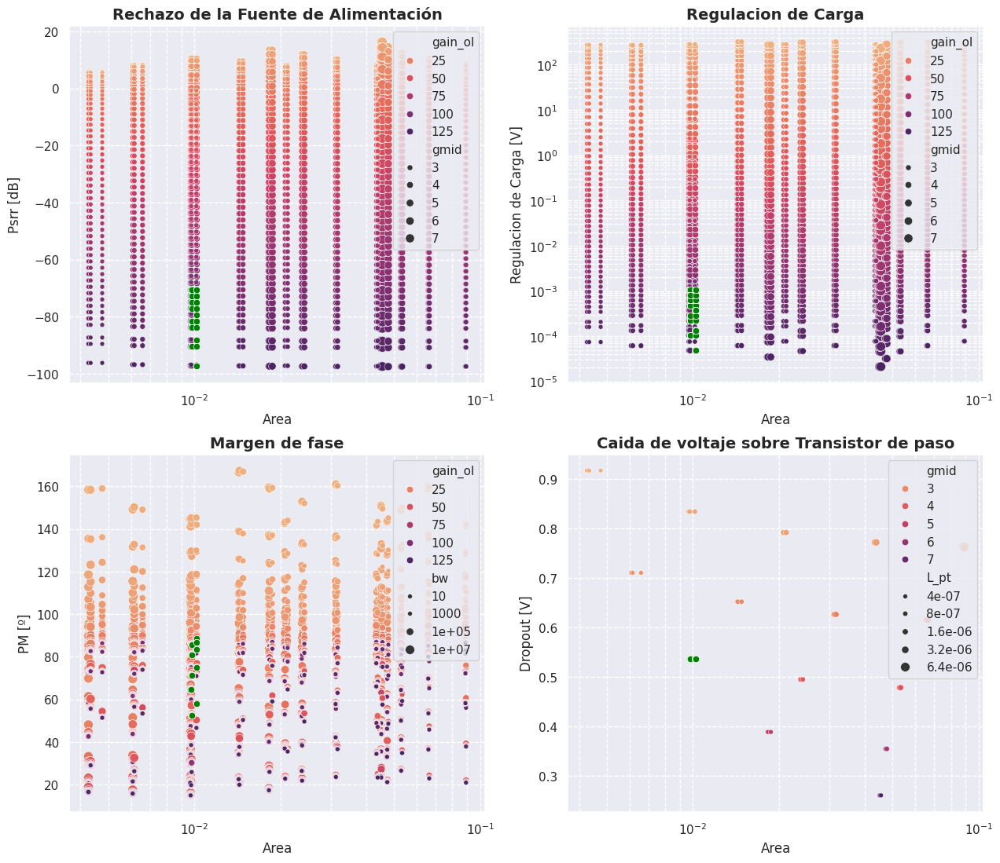

In [99]:
fig, axs = plt.subplots(2, 2, figsize=(15, 13))
sns.scatterplot(ax=axs[0,0], data=ldo_df, x='area', y='psrr', palette='flare', hue='gain_ol', rasterized=True, size='gmid')
sns.scatterplot(ax=axs[0,0], data=ldo_df_new, x='area', y='psrr', c='green')
sns.scatterplot(ax=axs[0,1], data=ldo_df, x='area', y='loadreg', palette='flare', rasterized=True, hue='gain_ol', size='gmid')
sns.scatterplot(ax=axs[0,1], data=ldo_df_new, x='area', y='loadreg', c='green')
sns.scatterplot(ax=axs[1,1], data=ldo_df, x='area', y=Symbol('dropout'), palette='flare', hue='gmid', rasterized=True, size=Symbol('L_pt'))
sns.scatterplot(ax=axs[1,1], data=ldo_df_new, x='area', y=Symbol('dropout'), c='green')
sns.scatterplot(ax=axs[1,0], data=ldo_df, x='area', y="phase_margin_LDO_wc", palette='flare', hue="gain_ol", rasterized=True, size="bw", size_norm=LogNorm(vmin=1e3, vmax=1e7))
sns.scatterplot(ax=axs[1,0], data=ldo_df_new, x='area', y="phase_margin_LDO_wc", c='green')

axs[0,0].set_title(r"Rechazo de la Fuente de Alimentación", fontsize=14, weight='bold')
axs[0,0].set_xlabel(r"Area")
axs[0,0].set_ylabel(r"Psrr [dB]")
axs[0,0].locator_params(axis='x', nbins=10) 
axs[0,0].legend(loc = 'upper right')

axs[0,1].set_title(r"Regulacion de Carga", fontsize=14, weight='bold')
axs[0,1].set_xlabel(r"Area")
axs[0,1].set_ylabel(r"Regulacion de Carga [V]")
axs[0,1].legend(loc = 'upper right')

axs[1,1].set_xlabel(r"Area")
axs[1,1].set_ylabel(r"Dropout [V]")
axs[1,1].set_title(r"Caida de voltaje sobre Transistor de paso", fontsize=14, weight='bold')
axs[1,1].legend(loc = 'upper right')

axs[1,0].set_title(r"Margen de fase", fontsize=14, weight='bold')
axs[1,0].set_xlabel(r"Area")
axs[1,0].set_ylabel(r"PM [º]")
axs[1,0].legend(loc = 'upper right')
#fig.suptitle(r"Ganancias intrínsecas", fontsize=24, y=1.1)

axs[0,0].set_xscale('log')
axs[0,1].set_xscale('log')
axs[1,0].set_xscale('log')
axs[1,1].set_xscale('log')

axs[0,1].set_yscale('log')


axs[0,0].grid(True,which="both",ls="--")  
axs[0,1].grid(True,which="both",ls="--")  
axs[1,0].grid(True,which="both",ls="--")  
axs[1,1].grid(True,which="both",ls="--")  

plt.savefig('ldo_explore_raw.svg', dpi=120)

# OTA exploration (specifications derivation)

In [21]:
OTA_macro.primitives = [Cc_primitive]
OTA_macro.submacromodels = [OTA_1stage_macro, OTA_2stage_macro]
OTA_macro.num_level_exp = 1
OTA_macro.specifications = [gain_OTA, rout_OTA, gm_OTA, phase_margin_OTA]
OTA_macro.opt_specifications = [gain_OTA]
OTA_macro.is_primitive = 0
OTA_macro.run_pareto = False

ota_results, ota_axes, ota_primouts, ota_df, _ = dfs(OTA_macro, debug = False)

############################################
Starting the exploration of:  OTA_macro
Netlist:  OpAmp_2stage
Running MNA... 
   net1  vss  vpos  vout  net2
0     1    0     2     3     4
[['vout', 'vpos']]
Netlist:  OpAmp_2stage_rout
Running MNA... 
   net1  vss  vpos  vout  net2  vr
0     1    0     2     3     4   5
[['vout', 'vr']]
Netlist:  OpAmp_2stage
Running MNA... 
   net1  vss  vpos  vout  net2
0     1    0     2     3     4
[['vout', 'vpos']]
Netlist:  OpAmp_2stage
Running MNA... 
   net1  vss  vpos  vout  net2
0     1    0     2     3     4
[['vout', 'vpos']]
older order of submacros:  [<sstadex.models.macromodel.Macromodel object at 0x7f0af5f5d210>, <sstadex.models.macromodel.Macromodel object at 0x7f0af5f5d4e0>]
new order of submacros:  [<sstadex.models.macromodel.Macromodel object at 0x7f0af5f5d210>, <sstadex.models.macromodel.Macromodel object at 0x7f0af5f5d4e0>]
[<sstadex.models.macromodel.Macromodel object at 0x7f0af5f5d210>, <sstadex.models.macromodel.Macromodel object

In [123]:
ota_df['gain_1stage'] = 20*np.log10(ota_df[Symbol('Ra_1stage')]*ota_df[Symbol('gma_1stage')])
ota_df['gain_2stage'] = 20*np.log10(ota_df[Symbol('Ra_2stage')]*ota_df[Symbol('gma_2stage')])

ota_df["Cin"] = ota_df[Symbol("Cin_2stage")]+ota_df[Symbol("gma_2stage")]*ota_df[Symbol("Ra_2stage")]*ota_df[Symbol("Cc")]

ota_df["bw"] = 1/(2*np.pi*ota_df[Symbol("Ra_1stage")]*(ota_df[Symbol("Cin_2stage")]+ota_df[Symbol("gma_2stage")]*ota_df[Symbol("Ra_2stage")]*ota_df[Symbol("Cc")]))

ota_df["Cc_area"] = ota_df[Symbol("W_cc")]+ota_df[Symbol("L_cc")]
ota_df['gain'] = 20*np.log10(ota_df['gain_OTA'])
ota_df_new = ota_df[(ota_df["gain"]>73.333) & (ota_df["phase_margin_OTA"]>80) & (ota_df["bw"]<1300) & (ota_df["bw"]>1000) & (ota_df["gm_OTA"]>0.000464)]
#ota_df_new = ota_df
ota_df_new.sort_values(by=["gain_1stage", "phase_margin_OTA"] , ascending=True)

,Ra_1stage,gma_1stage,Ra_2stage,gma_2stage,Cin_2stage,Cc,Rc,gain_OTA,rout_OTA,gm_OTA,...,L_cc,W_rc,L_rc,area,gain_1stage,gain_2stage,bw,Cc_area,gain,Cin
35953,2.782559e+03,0.000100,10000000.0,0.001778,1.000000e-11,3.162278e-12,10000.0,4.948168e+03,1.000000e+07,0.000495,...,0.000046,0.000004,5.000000e-07,0.000096,-11.111111,85.0,1016.947339,0.000092,73.888889,5.624413e-08
35938,2.782559e+03,0.000100,10000000.0,0.001778,5.623413e-13,3.162278e-12,1000.0,4.948168e+03,1.000000e+07,0.000495,...,0.000046,0.000001,5.000000e-07,0.000094,-11.111111,85.0,1017.118010,0.000092,73.888889,5.623469e-08
35929,2.782559e+03,0.000100,10000000.0,0.001778,3.162278e-14,3.162278e-12,1000.0,4.948168e+03,1.000000e+07,0.000495,...,0.000046,0.000001,5.000000e-07,0.000094,-11.111111,85.0,1017.127609,0.000092,73.888889,5.623416e-08
35920,2.782559e+03,0.000100,10000000.0,0.001778,1.778279e-15,3.162278e-12,1000.0,4.948168e+03,1.000000e+07,0.000495,...,0.000046,0.000001,5.000000e-07,0.000094,-11.111111,85.0,1017.128149,0.000092,73.888889,5.623413e-08
35911,2.782559e+03,0.000100,10000000.0,0.001778,1.000000e-16,3.162278e-12,1000.0,4.948168e+03,1.000000e+07,0.000495,...,0.000046,0.000001,5.000000e-07,0.000094,-11.111111,85.0,1017.128179,0.000092,73.888889,5.623413e-08
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
98431,1.291550e+06,0.004642,100000.0,0.000316,1.778279e-15,3.162278e-12,10000.0,1.895736e+05,1.000000e+05,1.895736,...,0.000046,0.000004,5.000000e-07,0.000096,75.555556,30.0,1232.257011,0.000092,105.555556,1.000018e-10
98422,1.291550e+06,0.004642,100000.0,0.000316,1.000000e-16,3.162278e-12,10000.0,1.895736e+05,1.000000e+05,1.895736,...,0.000046,0.000004,5.000000e-07,0.000096,75.555556,30.0,1232.277691,0.000092,105.555556,1.000001e-10
109761,1.291550e+06,0.010000,100000.0,0.010000,1.000000e-16,1.000000e-13,10000.0,1.291550e+07,1.000000e+05,129.154967,...,0.000008,0.000004,5.000000e-07,0.000021,82.222222,60.0,1232.277691,0.000016,142.222222,1.000001e-10
109681,1.291550e+06,0.010000,100000.0,0.000316,1.778279e-15,3.162278e-12,10000.0,4.084239e+05,1.000000e+05,4.084239,...,0.000046,0.000004,5.000000e-07,0.000096,82.222222,30.0,1232.257011,0.000092,112.222222,1.000018e-10


/tmp/ipykernel_35355/2037025260.py:30: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  axs[1,1].legend(loc = 'upper right')


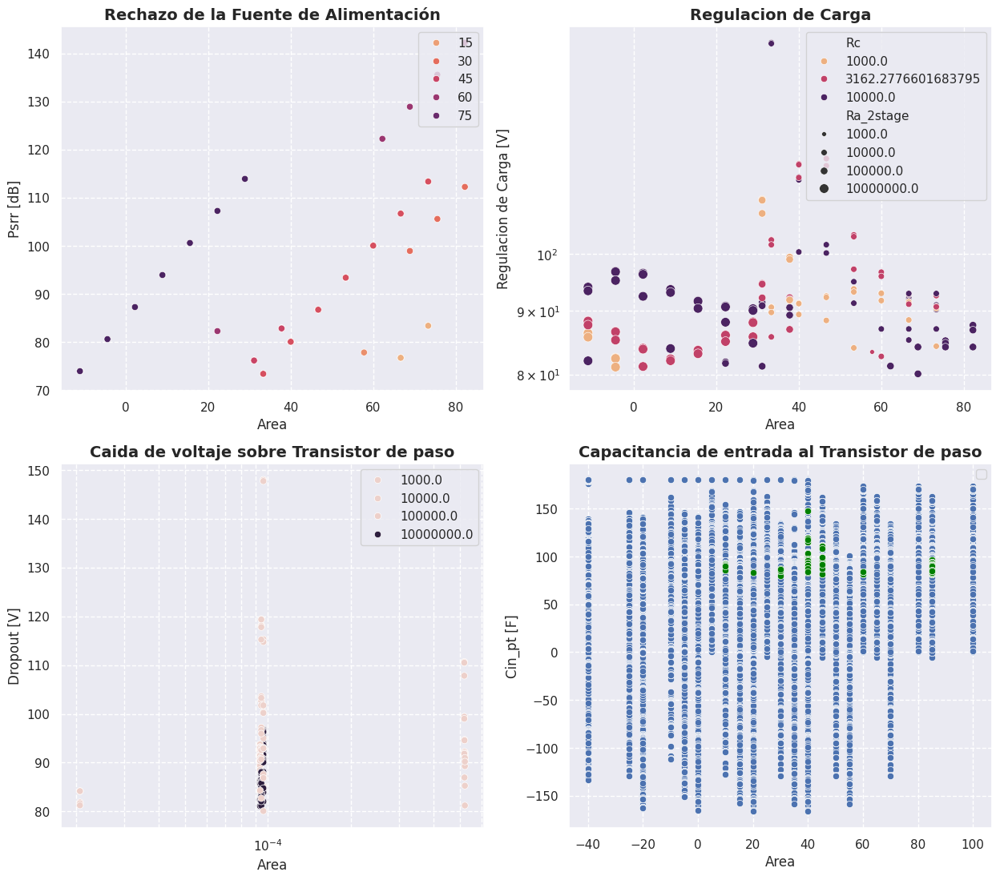

In [ ]:
fig, axs = plt.subplots(2, 2, figsize=(15, 13))
sns.scatterplot(ax=axs[0,0], data=ota_df_new, x='gain_1stage', y='gain', palette='flare', hue="gain_2stage")
#sns.scatterplot(ax=axs[0,0], data=ota_df_new, x='gain_1stage', y='gain', c='green')
sns.scatterplot(ax=axs[0,1], data=ota_df_new, x="gain_1stage", y="phase_margin_OTA", hue=Symbol("Rc"), palette='flare', hue_norm=LogNorm(), size=Symbol("Ra_2stage"), size_norm=LogNorm())
#sns.scatterplot(ax=axs[0,1], data=ota_df_new, x='gain_1stage', y='gain_2stage', c='green')
sns.scatterplot(ax=axs[1,0], data=ota_df_new, x="area", y="phase_margin_OTA", hue=Symbol("Ra_2stage"))
#sns.scatterplot(ax=axs[1,0], data=ota_df_new, x='gain_1stage', y="phase_margin_OTA", c='green')
sns.scatterplot(ax=axs[1,1], data=ota_df, x='gain_2stage', y="phase_margin_OTA")
sns.scatterplot(ax=axs[1,1], data=ota_df_new, x='gain_2stage', y="phase_margin_OTA", c='green')

axs[0,0].set_title(r"Rechazo de la Fuente de Alimentación", fontsize=14, weight='bold')
axs[0,0].set_xlabel(r"Area")
axs[0,0].set_ylabel(r"Psrr [dB]")
axs[0,0].locator_params(axis='x', nbins=10) 
axs[0,0].legend(loc = 'upper right')

axs[0,1].set_title(r"Regulacion de Carga", fontsize=14, weight='bold')
axs[0,1].set_xlabel(r"Area")
axs[0,1].set_ylabel(r"Regulacion de Carga [V]")
axs[0,1].legend(loc = 'upper right')

axs[1,0].set_xlabel(r"Area")
axs[1,0].set_ylabel(r"Dropout [V]")
axs[1,0].set_title(r"Caida de voltaje sobre Transistor de paso", fontsize=14, weight='bold')
axs[1,0].legend(loc = 'upper right')

axs[1,1].set_title(r"Capacitancia de entrada al Transistor de paso", fontsize=14, weight='bold')
axs[1,1].set_xlabel(r"Area")
axs[1,1].set_ylabel(r"Cin_pt [F]")
axs[1,1].legend(loc = 'upper right')
#fig.suptitle(r"Ganancias intrínsecas", fontsize=24, y=1.1)
#axs[0,1].set_yscale('log')
#axs[0,1].set_yscale('log')
axs[1,0].set_xscale('log')

axs[0,0].grid(True,which="both",ls="--")  
axs[0,1].grid(True,which="both",ls="--")  
axs[1,0].grid(True,which="both",ls="--")  
axs[1,1].grid(True,which="both",ls="--")  

plt.savefig('ota_explore_raw.svg', dpi=120)

# OTA 1stage exploration (specifications derivation)

## Case 2. No-load

In [22]:
OTA_1stage_macro.primitives = [diffpair, activeload, currentsource]
OTA_1stage_macro.submacromodels = [] 
OTA_1stage_macro.num_level_exp = -1
OTA_1stage_macro.specifications = [gain_1stage_OTA, rout_1stage_OTA, gm_1stage_OTA]
OTA_1stage_macro.opt_specifications = [gain_1stage_OTA]
OTA_1stage_macro.is_primitive = 0
OTA_1stage_macro.run_pareto = True

ota_1stage_results, ota_1stage_axes, ota_1stage_primouts, ota_1stage_df, _ = dfs(OTA_1stage_macro, debug = False)

############################################
Starting the exploration of:  OTA_1stage_macro
Netlist:  ota_1stage
Running MNA... 
   net1  vs  vneg  vout  vpos  vdd  vss
0     1   2     3     4     5    6    0
[('vout', 'vpos')]
Netlist:  ota_1stage_rout
Running MNA... 
   net1  vs  vneg  vout  vpos  vdd  vss  vr
0     1   2     3     4     5    6    0   7
[['vout', 'vr']]
Netlist:  ota_1stage
Running MNA... 
   net1  vs  vneg  vout  vpos  vdd  vss
0     1   2     3     4     5    6    0
[['vout', 'vpos']]
older order of submacros:  []
new order of submacros:  []
[]
in eval
(-2*Raload_1**2*Rcs*Rdiff_1**2*gaload_1*gdiff_1**2 - 2*Raload_1**2*Rcs*Rdiff_1*gaload_1*gdiff_1 - Raload_1**2*Rdiff_1**2*gaload_1*gdiff_1 - Raload_1**2*Rdiff_1*gdiff_1 - Raload_1*Rcs*Rdiff_1**2*gdiff_1**2 - Raload_1*Rcs*Rdiff_1*gdiff_1 - Raload_1*Rdiff_1**2*gdiff_1)/(2*Raload_1**2*Rcs*Rdiff_1*gaload_1*gdiff_1 + 2*Raload_1**2*Rcs*gaload_1 + Raload_1**2*Rdiff_1*gaload_1 + Raload_1**2 + 2*Raload_1*Rcs*Rdiff_1**2*gaload_

In [23]:
ota_1stage_df["gain"] = 20*np.log10(ota_1stage_df["gain_1stage"])
ota_1stage_df_new = ota_1stage_df
#ota_1stage_df_new = ota_1stage_df_new[ota_1stage_df_new[Symbol("vout_aload")]==ota_1stage_df_new[Symbol("vout_1stage")]]
#ota_1stage_df_new.sort_values(by=[Symbol("W_diff"), Symbol("W_al")])

In [24]:
ota_1stage_df_new.sort_values(by=[Symbol("W_diff"), Symbol("W_al")])

,gdiff_1,Rdiff_1,vs_diff,gaload_1,Raload_1,vout_aload,gcs,Rcs,vs_cs,vgs_cs,...,gm_1stage,W_diff,L_diff,vout_1stage,W_al,L_al,W_cs,L_cs,area,gain
2520,0.000468,101615.563212,0.3,0.000296,4.695369e+05,1.15,0.000622,54626.416980,0.3,0.7,...,0.000459,0.000093,4.500000e-07,1.15,0.000055,4.000000e-07,0.000034,4.500000e-07,0.000184,31.812762
2521,0.000468,101615.563212,0.3,0.000296,4.695369e+05,1.15,0.000605,87737.871973,0.3,0.7,...,0.000459,0.000093,4.500000e-07,1.15,0.000055,4.000000e-07,0.000069,8.000000e-07,0.000219,31.812537
2522,0.000468,101615.563212,0.3,0.000296,4.695369e+05,1.15,0.000277,54238.348394,0.3,0.9,...,0.000459,0.000093,4.500000e-07,1.15,0.000055,4.000000e-07,0.000009,8.000000e-07,0.000159,31.812766
2523,0.000468,101615.563212,0.3,0.000296,4.695369e+05,1.15,0.000508,153909.680491,0.3,0.7,...,0.000459,0.000093,4.500000e-07,1.15,0.000055,4.000000e-07,0.000093,1.600000e-06,0.000244,31.812375
2524,0.000468,101615.563212,0.3,0.000296,4.695369e+05,1.15,0.000255,82972.681723,0.3,0.9,...,0.000459,0.000093,4.500000e-07,1.15,0.000055,4.000000e-07,0.000016,1.600000e-06,0.000167,31.812558
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12904,0.000361,733139.238822,0.3,0.000087,1.746061e+07,0.70,0.000255,82972.681723,0.3,0.9,...,0.000358,0.000314,3.200000e-06,0.70,0.000048,6.400000e-06,0.000016,1.600000e-06,0.000389,48.091118
12905,0.000361,733139.238822,0.3,0.000087,1.746061e+07,0.70,0.000460,265336.235952,0.3,0.7,...,0.000358,0.000314,3.200000e-06,0.70,0.000048,6.400000e-06,0.000149,3.200000e-06,0.000524,48.091086
12906,0.000361,733139.238822,0.3,0.000087,1.746061e+07,0.70,0.000242,111993.012716,0.3,0.9,...,0.000358,0.000314,3.200000e-06,0.70,0.000048,6.400000e-06,0.000028,3.200000e-06,0.000403,48.091106
12907,0.000361,733139.238822,0.3,0.000087,1.746061e+07,0.70,0.000439,469096.591235,0.3,0.7,...,0.000358,0.000314,3.200000e-06,0.70,0.000048,6.400000e-06,0.000268,6.400000e-06,0.000646,48.091079


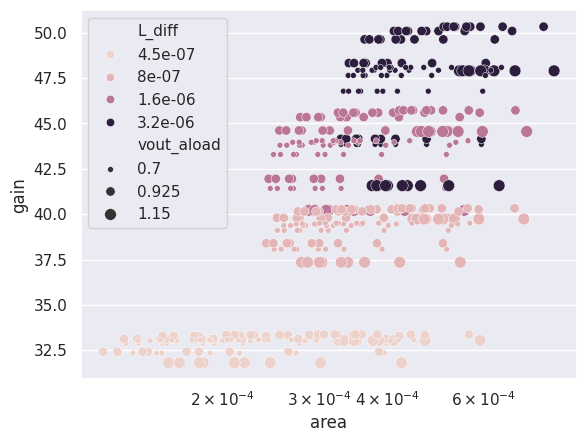

In [25]:
sns.scatterplot(data=ota_1stage_df_new, x="area", y="gain", hue=Symbol("L_diff"), size=Symbol("vout_aload"))
plt.xscale("log")

# OTA 2stage exploration (specifications derivation)

In [95]:
OTA_2stage_macro.primitives = [stage2_t, stage2_cs]
OTA_2stage_macro.submacromodels = [] 
OTA_2stage_macro.num_level_exp = -1
OTA_2stage_macro.specifications = [gain_2stage_OTA, rout_2stage_OTA, gm_2stage_OTA]
OTA_2stage_macro.opt_specifications = [gain_2stage_OTA]
OTA_2stage_macro.is_primitive = 0
OTA_2stage_macro.run_pareto = True

ota_2stage_results, ota_2stage_axes, ota_2stage_primouts, ota_2stage_df, _ = dfs(OTA_2stage_macro, debug = False)

############################################
Starting the exploration of:  ota_2stage_v2
Netlist:  ota_2stage_v2
Running MNA... 
   vdd  vout  vin  vss
0    1     2    3    0
[('vout', 'vin')]
Netlist:  ota_2stage_rout_v2
Running MNA... 
   vr  vss  vout  vdd  vin
0   1    0     2    3    4
[['vout', 'vr']]
Netlist:  ota_2stage_v2
Running MNA... 
   vdd  vout  vin  vss
0    1     2    3    0
[['vout', 'vin']]
older order of submacros:  []
new order of submacros:  []
[]
in eval
-Rcs_2stage*Ro_2stage*gm_2stage/(Rcs_2stage + Ro_2stage)
lambdify variables: (gm_2stage, Ro_2stage, Cin_2stage, gcs_2stage, Rcs_2stage, vgs_cs_2stage) <function _lambdifygenerated at 0x7f6ce17d60e0>
#### creating the primods_list ####
0
starting the return
finished explore operation
evaluation shape:  (3125,)
abs done
in eval
Rcs_2stage*Ro_2stage/(Rcs_2stage*Ro_2stage + 1000*Rcs_2stage + 1000*Ro_2stage)
lambdify variables: (gm_2stage, Ro_2stage, Cin_2stage, gcs_2stage, Rcs_2stage, vgs_cs_2stage) <function _lambdi

In [98]:
ota_2stage_df["gain"] = 20*np.log10(ota_2stage_df["gain_2stage"])
ota_2stage_df.sort_values(by=Symbol("Ro_2stage"))

,gm_2stage,Ro_2stage,Cin_2stage,gcs_2stage,Rcs_2stage,vgs_cs_2stage,gain_2stage,rout_2stage,gm_2stage,W_2stage,L_2stage,vin_2stage,W_cs_2stage,L_cs_2stage,area,gain
0,0.000056,9.726832e+05,1.096750e-13,0.000545,8.609087e+04,0.7,4.392141,7.909067e+04,0.000056,0.000005,0.000003,1.3,0.000034,4.500000e-07,0.000043,12.853526
4,0.000056,9.726832e+05,1.096750e-13,0.000574,1.852003e+05,0.7,8.639711,1.555780e+05,0.000056,0.000005,0.000003,1.3,0.000069,8.000000e-07,0.000078,18.729984
12,0.000056,9.726832e+05,1.096750e-13,0.000498,4.622569e+05,0.7,17.400916,3.133437e+05,0.000056,0.000005,0.000003,1.3,0.000093,1.600000e-06,0.000103,24.811442
8,0.000056,9.726832e+05,1.096750e-13,0.000275,3.537275e+05,0.9,14.405000,2.593953e+05,0.000056,0.000005,0.000003,1.3,0.000009,8.000000e-07,0.000018,23.170265
24,0.000056,9.726832e+05,1.096750e-13,0.000244,1.677598e+06,0.9,34.191521,6.156974e+05,0.000056,0.000005,0.000003,1.3,0.000028,3.200000e-06,0.000040,30.678368
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
215,0.000074,4.890179e+06,7.449112e-13,0.000321,1.342984e+06,0.8,78.202883,1.053627e+06,0.000074,0.000018,0.000006,1.6,0.000056,3.200000e-06,0.000083,37.864455
231,0.000074,4.890179e+06,7.449112e-13,0.000192,4.066706e+06,1.0,164.795832,2.220294e+06,0.000074,0.000018,0.000006,1.6,0.000031,6.400000e-06,0.000062,44.338924
227,0.000074,4.890179e+06,7.449112e-13,0.000311,2.775179e+06,0.8,131.407141,1.770448e+06,0.000074,0.000018,0.000006,1.6,0.000105,6.400000e-06,0.000136,42.372379
235,0.000074,4.890179e+06,7.449112e-13,0.000136,5.271366e+06,1.2,188.288529,2.536811e+06,0.000074,0.000018,0.000006,1.6,0.000014,6.400000e-06,0.000045,45.496477


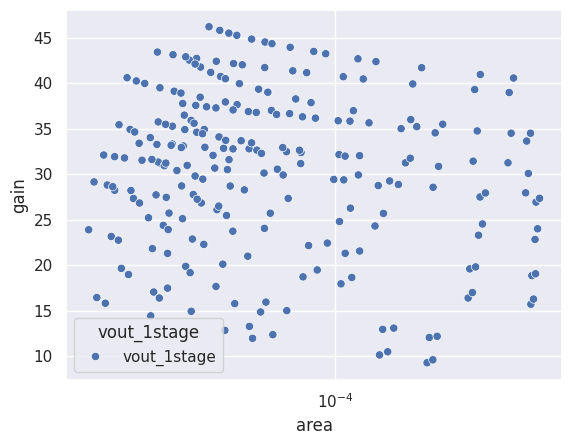

In [97]:
sns.scatterplot(data=ota_2stage_df, x="area", y="gain", hue=Symbol("vout_1stage"))
plt.xscale("log")

# OTA (Going up)

In [23]:
print(OTA_2stage_macro)
print(OTA_1stage_macro)

In [17]:
OTA_2stage_macro.primitives = [stage2_t, stage2_cs]
OTA_2stage_macro.submacromodels = [] 
OTA_2stage_macro.num_level_exp = -1
OTA_2stage_macro.specifications = [gain_2stage_OTA, rout_2stage_OTA, gm_2stage_OTA]
OTA_2stage_macro.opt_specifications = [gain_2stage_OTA]
OTA_2stage_macro.is_primitive = 0
OTA_2stage_macro.run_pareto = True

OTA_1stage_macro.primitives = [diffpair, activeload, currentsource]
OTA_1stage_macro.submacromodels = [] 
OTA_1stage_macro.num_level_exp = -1
OTA_1stage_macro.specifications = [gain_1stage_OTA, rout_1stage_OTA, gm_1stage_OTA]
OTA_1stage_macro.opt_specifications = [gain_1stage_OTA]
OTA_1stage_macro.is_primitive = 0
OTA_1stage_macro.run_pareto = True

OTA_macro.primitives = [Cc_primitive]
OTA_macro.submacromodels = [OTA_1stage_macro, OTA_2stage_macro]
OTA_macro.num_level_exp = -1
OTA_macro.specifications = [gain_OTA]
OTA_macro.opt_specifications = [gain_OTA]
OTA_macro.is_primitive = 0
OTA_macro.run_pareto = False

ota_results, ota_axes, ota_primouts, ota_df, _ = dfs(OTA_macro, debug = False)

############################################
Starting the exploration of:  OTA_macro
Netlist:  OpAmp_2stage
Running MNA... 
   net1  vss  vpos  vout  net2
0     1    0     2     3     4
[['vout', 'vpos']]
older order of submacros:  [<sstadex.models.macromodel.Macromodel object at 0x7f52f44c6cb0>, <sstadex.models.macromodel.Macromodel object at 0x7f52f44c6a10>]
new order of submacros:  [<sstadex.models.macromodel.Macromodel object at 0x7f52f44c6cb0>, <sstadex.models.macromodel.Macromodel object at 0x7f52f44c6a10>]
[<sstadex.models.macromodel.Macromodel object at 0x7f52f44c6cb0>, <sstadex.models.macromodel.Macromodel object at 0x7f52f44c6a10>]
in eval
-Ra_1stage*Ra_2stage*gma_1stage*gma_2stage
lambdify variables: (Ra_1stage, gma_1stage, Ra_2stage, gma_2stage, Cin_2stage, Cc, Rc) <function _lambdifygenerated at 0x7f52f3d7f250>
#### creating the primods_list ####
12500
finished for operation
starting the return
finished explore operation
evaluation shape:  (112500,)
abs done
[[8.16496581e-

In [18]:
ota_df["gain"] = 20*np.log10(ota_df["gain_OTA"])
ota_df_new = ota_df
ota_df_new.sort_values(by=["area"])

,Ra_2stage,gma_2stage,Cin_2stage,Ra_1stage,gma_1stage,Cc,Rc,gain_OTA,W_2stage,L_2stage,...,L_al,W_cs,L_cs,vgs_cs,W_cc,L_cc,W_rc,L_rc,area,gain
115200,538552.971616,0.000292,8.626920e-14,91786.492016,0.000455,1.000000e-13,1000.00000,6576.789676,0.000033,8.000000e-07,...,4.000000e-07,0.000028,0.000003,0.9,0.000008,0.000008,0.000001,5.000000e-07,0.000227,76.360279
115203,538552.971616,0.000292,8.626920e-14,91786.492016,0.000455,1.000000e-13,3162.27766,6576.789676,0.000033,8.000000e-07,...,4.000000e-07,0.000028,0.000003,0.9,0.000008,0.000008,0.000002,5.000000e-07,0.000227,76.360279
321246,654311.666533,0.000171,1.829304e-13,97751.173087,0.000451,1.000000e-13,1000.00000,4940.243272,0.000022,1.600000e-06,...,8.000000e-07,0.000028,0.000003,0.9,0.000008,0.000008,0.000001,5.000000e-07,0.000228,73.874967
321249,654311.666533,0.000171,1.829304e-13,97751.173087,0.000451,1.000000e-13,3162.27766,4940.243272,0.000022,1.600000e-06,...,8.000000e-07,0.000028,0.000003,0.9,0.000008,0.000008,0.000002,5.000000e-07,0.000229,73.874967
115206,538552.971616,0.000292,8.626920e-14,91786.492016,0.000455,1.000000e-13,10000.00000,6576.789676,0.000033,8.000000e-07,...,4.000000e-07,0.000028,0.000003,0.9,0.000008,0.000008,0.000004,5.000000e-07,0.000229,76.360279
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
636962,180926.787369,0.000585,1.799146e-13,689416.594472,0.000360,1.000000e-10,3162.27766,26303.382483,0.000106,4.000000e-07,...,8.000000e-07,0.000149,0.000003,0.7,0.000258,0.000258,0.000002,5.000000e-07,0.001462,88.400232
636965,180926.787369,0.000585,1.799146e-13,689416.594472,0.000360,1.000000e-10,10000.00000,26303.382483,0.000106,4.000000e-07,...,8.000000e-07,0.000149,0.000003,0.7,0.000258,0.000258,0.000004,5.000000e-07,0.001464,88.400232
1329923,533449.732448,0.000311,2.720098e-12,913710.817275,0.000360,1.000000e-10,1000.00000,54585.610293,0.000170,3.200000e-06,...,6.400000e-06,0.000149,0.000003,0.7,0.000258,0.000258,0.000001,5.000000e-07,0.001494,94.741563
1329926,533449.732448,0.000311,2.720098e-12,913710.817275,0.000360,1.000000e-10,3162.27766,54585.610293,0.000170,3.200000e-06,...,6.400000e-06,0.000149,0.000003,0.7,0.000258,0.000258,0.000002,5.000000e-07,0.001495,94.741563


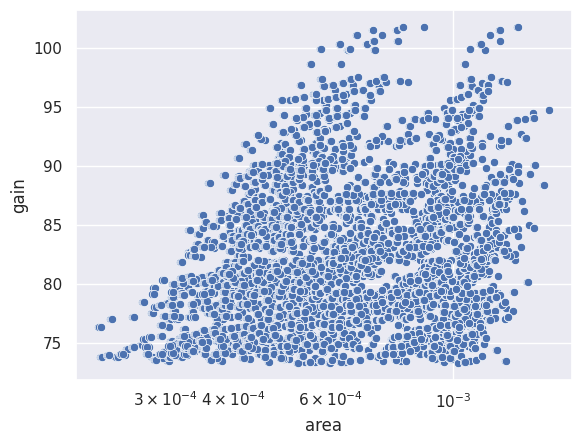

In [19]:
sns.scatterplot(data=ota_df_new, x="area", y="gain")
plt.xscale("log")

In [20]:
ota_df_new.to_csv("ota_df_new" + ".csv")

# PM tryout

In [34]:
ota_df_new = pd.read_csv('ota_df_new.csv')  

In [35]:
OTA_2stage_primitive = Primitive(parameters={Symbol("Ra_2stage"): ota_df_new["Ra_2stage"].values,
                                  Symbol("gma_2stage"): ota_df_new["gma_2stage"].values,
                                  Symbol("Cin_2stage"): ota_df_new["Cin_2stage"].values,

                                  Symbol("Ra_1stage"): ota_df_new["Ra_1stage"].values,
                                  Symbol("gma_1stage"): ota_df_new["gma_1stage"].values,

                                  Symbol("Cc"): ota_df_new["Cc"].values,
                                  Symbol("Rc"): ota_df_new["Rc"].values,})
OTA_2stage_primitive.outputs = {
    Symbol("W_2stage"): ota_df_new["W_2stage"].values,
    Symbol("L_2stage"): ota_df_new["L_2stage"].values,
    Symbol("vin_2stage"): ota_df_new["vin_2stage"].values,
    Symbol("W_cs_2stage"): ota_df_new["W_cs_2stage"].values,
    Symbol("L_cs_2stage"): ota_df_new["L_cs_2stage"].values,
    Symbol("vgs_cs_2stage"): ota_df_new["vgs_cs_2stage"].values,
    
    Symbol("W_diff"): ota_df_new["W_diff"].values,
    Symbol("L_diff"): ota_df_new["L_diff"].values,
    Symbol("vout_1stage"): ota_df_new["vout_1stage"].values,
    Symbol("W_al"): ota_df_new["W_al"].values,
    Symbol("L_al"): ota_df_new["L_al"].values,
    Symbol("W_cs"): ota_df_new["W_cs"].values,
    Symbol("L_cs"): ota_df_new["L_cs"].values,
    Symbol("vgs_cs"): ota_df_new["vgs_cs"].values,
    
    Symbol("W_cc"): ota_df_new["W_cc"].values,
    Symbol("L_cc"): ota_df_new["L_cc"].values,
    
    Symbol("W_rc"): ota_df_new["W_rc"].values,
    Symbol("L_rc"): ota_df_new["L_rc"].values}

In [36]:
OTA_macro.primitives = [OTA_2stage_primitive]
OTA_macro.submacromodels = []
OTA_macro.num_level_exp = 1
OTA_macro.specifications = [gain_OTA, phase_margin_OTA]
OTA_macro.opt_specifications = [gain_OTA]
OTA_macro.is_primitive = 0
OTA_macro.run_pareto = False

ota_results, ota_axes, ota_primouts, ota_df, _ = dfs(OTA_macro, debug = False)

############################################
Starting the exploration of:  OpAmp_2stage
Netlist:  OpAmp_2stage
Running MNA... 
   net1  vss  vpos  vout  net2
0     1    0     2     3     4
[['vout', 'vpos']]
Netlist:  OpAmp_2stage
Running MNA... 
   net1  vss  vpos  vout  net2
0     1    0     2     3     4
[['vout', 'vpos']]
older order of submacros:  []
new order of submacros:  []
[]
in eval
-Ra_1stage*Ra_2stage*gma_1stage*gma_2stage
lambdify variables: (Ra_2stage, gma_2stage, Cin_2stage, Ra_1stage, gma_1stage, Cc, Rc) <function _lambdifygenerated at 0x7f6da71a6710>
#### creating the primods_list ####
0
starting the return
finished explore operation
evaluation shape:  (7911,)
abs done
in frec
#### creating the primods_list ####
0
starting the return
eval:  [(2.38671195848458e-6*s - 5013.58985663766)/(1.40972529840261e-22*s**3 + 1.57954899655679e-12*s**2 + 1.88353169549945e-5*s + 1)
 (7.54744590757251e-5*s - 5013.58985663766)/(4.45794281811278e-21*s**3 + 6.78002216680405e-12*s**2 + 5.

In [37]:
ota_df["gain"] = 20*np.log10(ota_df["gain_OTA"])
ota_df_new["phase_margin_OTA"] = ota_df["phase_margin_OTA"]

In [ ]:
ota_df_new = ota_df_new[(ota_df_new["phase_margin_OTA"]>65) & (ota_df_new["phase_margin_OTA"]<100)]
ota_df_new

,Unnamed: 0,Ra_2stage,gma_2stage,Cin_2stage,Ra_1stage,gma_1stage,Cc,Rc,gain_OTA,W_2stage,...,W_cs,L_cs,vgs_cs,W_cc,L_cc,W_rc,L_rc,area,gain,phase_margin_OTA
17,9890,7.232598e+05,0.000175,3.726669e-12,92541.862203,0.000447,1.000000e-10,10000.00000,5227.931873,0.000096,...,0.000028,0.000003,0.9,0.000258,0.000258,0.000004,5.000000e-07,0.000807,74.366598,91.354553
53,13238,1.259731e+06,0.000175,3.726669e-12,92553.217653,0.000447,1.000000e-10,10000.00000,9105.595058,0.000096,...,0.000054,0.000006,0.9,0.000258,0.000258,0.000004,5.000000e-07,0.000864,79.186167,91.257355
80,26819,4.057458e+05,0.000175,3.726669e-12,171700.555322,0.000467,1.000000e-10,10000.00000,5675.849533,0.000096,...,0.000016,0.000002,0.9,0.000258,0.000258,0.000004,5.000000e-07,0.000896,75.080617,87.712308
116,29897,5.441140e+05,0.000175,3.726669e-12,171747.971878,0.000466,1.000000e-10,10000.00000,7611.034835,0.000096,...,0.000149,0.000003,0.7,0.000258,0.000258,0.000004,5.000000e-07,0.001167,77.628874,87.613257
152,32975,7.232598e+05,0.000175,3.726669e-12,171718.333167,0.000466,1.000000e-10,10000.00000,10117.251008,0.000096,...,0.000028,0.000003,0.9,0.000258,0.000258,0.000004,5.000000e-07,0.000925,80.101250,87.541458
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7874,1334132,7.045380e+05,0.000311,2.720098e-12,913689.682672,0.000360,1.000000e-10,10000.00000,72092.439605,0.000170,...,0.000028,0.000003,0.9,0.000258,0.000258,0.000004,5.000000e-07,0.001255,97.157794,74.161451
7889,1342436,7.886319e+05,0.000292,8.626920e-14,913696.678211,0.000360,1.000000e-10,3162.27766,75822.509819,0.000033,...,0.000054,0.000006,0.9,0.000258,0.000258,0.000002,5.000000e-07,0.001171,97.595963,68.215273
7898,1342445,1.069538e+06,0.000306,5.189703e-13,913696.678211,0.000360,1.000000e-10,3162.27766,107494.071290,0.000078,...,0.000054,0.000006,0.9,0.000258,0.000258,0.000002,5.000000e-07,0.001217,100.627690,71.480908
7907,1342454,1.204005e+06,0.000311,2.720098e-12,913696.678211,0.000360,1.000000e-10,3162.27766,123200.797033,0.000170,...,0.000054,0.000006,0.9,0.000258,0.000258,0.000002,5.000000e-07,0.001311,101.812270,71.186410


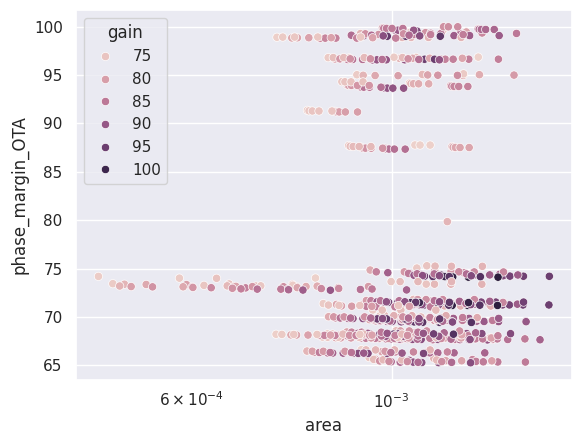

In [39]:
sns.scatterplot(data=ota_df_new, x="area", y="phase_margin_OTA", hue="gain")
plt.xscale("log")

In [50]:
W_diff = ota_df_new["W_diff"].values*1e6
L_diff = ota_df_new["L_diff"].values*1e6

W_al = ota_df_new["W_al"].values*1e6
L_al = ota_df_new["L_al"].values*1e6

W_cs = ota_df_new["W_cs"].values*1e6
L_cs = ota_df_new["L_cs"].values*1e6

W_2stage = ota_df_new["W_2stage"].values*1e6
L_2stage = ota_df_new["L_2stage"].values*1e6

Cc = ota_df_new["Cc"].values
Rc = ota_df_new["Rc"].values

mult_diff = []
for idx, i in enumerate(W_diff):
    if i>100:
        mult_diff.append(10)
    else:
        mult_diff.append(1)

mult_al = []
for idx, i in enumerate(W_al):
    if i>100:
        mult_al.append(10)
    else:
        mult_al.append(1)

values = {
    "XM1": [
        W_diff,
        L_diff,
        mult_diff,
        "nfet",
    ],
    "XM2": [
        W_diff,
        L_diff,
        mult_diff,
        "nfet",
    ],
    "XM3": [
        W_al,
        L_al,
        mult_diff,
        "nfet",
    ],
    "XM4": [
        W_al,
        L_al,
        mult_diff,
        "nfet",
    ],
    "XM5": [
        W_2stage,
        L_2stage,
        mult_diff,
        "nfet",
    ],
    "XM6": [
        W_cs,
        L_cs,
        mult_diff,
        "nfet",
    ],
    "XM7": [
        W_cs,
        L_cs,
        mult_diff,
        "nfet",
    ],
    "XM8": [
        W_cs,
        L_cs,
        mult_diff,
        "nfet",
    ],
    "I2": np.full(len(W_diff), I_amp2),
    "Cc": Cc,
    "Rc": Rc
}

simulation_results = spice_sim("ota_2stage_tb", values)

[array([117.06683064, 117.06683064, 235.37635879, 235.37635879,
       235.37635879, 235.37635879, 230.50723217, 230.50723217,
       230.50723217, 230.50723217, 230.50723217, 313.58867475,
       313.58867475, 313.58867475, 313.58867475, 104.23710789,
       104.23710789, 104.23710789, 104.23710789, 104.23710789,
       104.23710789, 104.23710789, 104.23710789, 104.23710789,
       104.23710789, 104.23710789, 104.23710789, 104.23710789,
       104.23710789, 104.23710789, 104.23710789, 223.02776901,
       223.02776901, 223.02776901, 223.02776901, 223.02776901,
       223.02776901, 223.02776901, 223.02776901, 223.02776901,
       223.02776901, 223.02776901, 223.02776901, 223.02776901,
       223.02776901, 223.02776901, 223.02776901, 223.02776901,
       223.02776901, 223.02776901, 223.02776901, 223.02776901,
       223.02776901, 223.02776901, 223.02776901, 224.7933547 ,
       224.7933547 , 224.7933547 , 224.7933547 , 224.7933547 ,
       224.7933547 , 224.7933547 , 224.7933547 , 224.7


Circuit: ** sch_path: /workspaces/usm-vlsi-tools/shared_xserver/sstadex/test/tesis_notebooks/xschem/ota_2stage_tb.sch

Doing analysis at TEMP = 27.000000 and TNOM = 27.000000

 Reference value :  1.00000e+00
No. of Data Rows : 91
Note: Simulation executed from .control section 
test numer:  1
** sch_path: /workspaces/usm-vlsi-tools/shared_xserver/SSTADEx/test/Tesis_notebooks/xschem/ota_2stage_tb.sch

**.subckt ota_2stage_tb

XM1
['XM1', 'vout_s1', 'vn', 'vs', 'vs', 'sg13_hv_nmos', 'L=0.44999999999999996u', 'W=117.0668306444u', 'ng=1', 'm=1']
XM1 vout_s1 vn vs vs sg13_hv_nmos L=0.44999999999999996u W=117.0668306444u ng=1 m=1 

XM2
['XM2', 'net2', 'net1', 'vs', 'vs', 'sg13_hv_nmos', 'L=0.44999999999999996u', 'W=117.0668306444u', 'ng=1', 'm=1']
XM2 net2 net1 vs vs sg13_hv_nmos L=0.44999999999999996u W=117.0668306444u ng=1 m=1 

XM3
['XM3', 'vout_s1', 'net2', 'vdd', 'vdd', 'sg13_hv_pmos', 'L=0.39999999999999997u', 'W=1.925030051092144u', 'ng=1', 'm=1']
XM3 vout_s1 net2 vdd vdd sg13_hv_pmo

In [51]:
gain_error = []

for df in simulation_results:
    gain_error.append(float(df.columns[1]))

ota_df_new["gain_sim"]=gain_error
ota_df_new["gain_error"] = (np.abs(np.asarray(gain_error) - ota_df_new["gain"].values)/np.asarray(gain_error))*100

In [52]:
sim_pm = []

for sim in simulation_results:
    gain = np.abs(sim.iloc[:,1])
    fc_arg = np.argmin(gain)
    phase = sim.iloc[fc_arg,3]
    sim_pm.append(phase*180/np.pi)

In [53]:
ota_df_new.sort_values(by="area")

,Unnamed: 0,Ra_2stage,gma_2stage,Cin_2stage,Ra_1stage,gma_1stage,Cc,Rc,gain_OTA,W_2stage,...,L_cc,W_rc,L_rc,area,gain,phase_margin_OTA,gain_sim,gain_error,pm_sim,pm_error
1375,223630,223061.541186,0.000585,1.799146e-13,84905.356752,0.000459,3.162278e-12,10000.00000,5086.159591,0.000106,...,0.000046,0.000004,5.000000e-07,0.000473,74.127800,74.190450,74.275225,0.198485,69.834729,6.237185
1384,230650,119697.171255,0.000585,1.799146e-13,154628.635414,0.000477,3.162278e-12,10000.00000,5161.727362,0.000106,...,0.000046,0.000004,5.000000e-07,0.000491,74.255901,73.436751,74.237328,0.025019,64.007154,14.732099
1447,257128,119697.171255,0.000585,1.799146e-13,253844.487634,0.000404,3.162278e-12,10000.00000,7177.169896,0.000106,...,0.000046,0.000004,5.000000e-07,0.000499,77.119065,73.197239,77.204047,0.110075,63.849564,14.640154
1402,236437,162500.033083,0.000585,1.799146e-13,154635.927577,0.000476,3.162278e-12,10000.00000,7007.362289,0.000106,...,0.000046,0.000004,5.000000e-07,0.000505,76.911091,73.382251,77.013504,0.132980,64.242144,14.227587
1465,263833,162500.033083,0.000585,1.799146e-13,253850.352971,0.000404,3.162278e-12,10000.00000,9743.410127,0.000106,...,0.000046,0.000004,5.000000e-07,0.000514,79.774220,73.138173,79.959375,0.231561,61.989394,17.984978
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7547,1294034,533449.732448,0.000311,2.720098e-12,478696.954255,0.000404,1.000000e-10,3162.27766,32091.619089,0.000170,...,0.000258,0.000002,5.000000e-07,0.001408,90.127833,69.535003,90.397001,0.297762,63.739456,9.092559
7550,1294037,533449.732448,0.000311,2.720098e-12,478696.954255,0.000404,1.000000e-10,10000.00000,32091.619089,0.000170,...,0.000258,0.000004,5.000000e-07,0.001410,90.127833,69.509641,90.396999,0.297760,60.428624,15.027674
3278,636959,180926.787369,0.000585,1.799146e-13,689416.594472,0.000360,1.000000e-10,1000.00000,26303.382483,0.000106,...,0.000258,0.000001,5.000000e-07,0.001461,88.400232,67.641016,88.705441,0.344070,63.515529,6.495242
7835,1329926,533449.732448,0.000311,2.720098e-12,913710.817275,0.000360,1.000000e-10,3162.27766,54585.610293,0.000170,...,0.000258,0.000002,5.000000e-07,0.001495,94.741563,71.239298,95.031160,0.304738,68.603883,3.841495


In [54]:
ota_df_new["pm_sim"]=sim_pm
ota_df_new["pm_error"]=(np.abs(ota_df_new["phase_margin_OTA"].values-sim_pm)/np.abs(sim_pm))*100

In [58]:
ota_df_new.sort_values(by="area")[(ota_df_new["W_diff"]<2e-4) & (ota_df_new["W_al"]<2e-4)]

/tmp/ipykernel_9500/3711184159.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  ota_df_new.sort_values(by="area")[(ota_df_new["W_diff"]<2e-4) & (ota_df_new["W_al"]<2e-4)]


,Unnamed: 0,Ra_2stage,gma_2stage,Cin_2stage,Ra_1stage,gma_1stage,Cc,Rc,gain_OTA,W_2stage,...,L_cc,W_rc,L_rc,area,gain,phase_margin_OTA,gain_sim,gain_error,pm_sim,pm_error
1375,223630,223061.541186,0.000585,1.799146e-13,84905.356752,0.000459,3.162278e-12,10000.00000,5086.159591,0.000106,...,0.000046,0.000004,5.000000e-07,0.000473,74.127800,74.190450,74.275225,0.198485,71.034436,4.442935
590,111749,383765.189022,0.000306,5.189703e-13,91775.002249,0.000455,1.000000e-10,3162.27766,4899.165936,0.000078,...,0.000258,0.000002,5.000000e-07,0.000744,73.802443,68.208862,73.691269,0.150864,71.748764,4.933747
593,111752,383765.189022,0.000306,5.189703e-13,91775.002249,0.000455,1.000000e-10,10000.00000,4899.165936,0.000078,...,0.000258,0.000004,5.000000e-07,0.000746,73.802443,98.905223,73.691269,0.150864,95.821901,3.217763
2237,429881,383765.189022,0.000306,5.189703e-13,98835.213799,0.000458,1.000000e-10,3162.27766,5312.874191,0.000078,...,0.000258,0.000002,5.000000e-07,0.000756,74.506591,68.195086,74.443517,0.084727,71.682782,4.865459
2240,429884,383765.189022,0.000306,5.189703e-13,98835.213799,0.000458,1.000000e-10,10000.00000,5312.874191,0.000078,...,0.000258,0.000004,5.000000e-07,0.000757,74.506591,98.922804,74.443516,0.084728,95.219220,3.889534
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5570,1005785,533449.732448,0.000311,2.720098e-12,101123.714448,0.000459,1.000000e-10,10000.00000,7712.320808,0.000170,...,0.000258,0.000004,5.000000e-07,0.001193,77.743702,71.132365,77.866773,0.158053,55.173504,28.924863
7097,1237595,505302.470758,0.000306,5.189703e-13,101407.101834,0.000460,1.000000e-10,3162.27766,7197.787429,0.000078,...,0.000258,0.000002,5.000000e-07,0.001193,77.143980,68.152681,77.266391,0.158427,67.279514,1.297820
7100,1237598,505302.470758,0.000306,5.189703e-13,101407.101834,0.000460,1.000000e-10,10000.00000,7197.787429,0.000078,...,0.000258,0.000004,5.000000e-07,0.001195,77.143980,98.888065,77.266391,0.158426,79.995741,23.616662
7106,1237604,533449.732448,0.000311,2.720098e-12,101407.101834,0.000460,1.000000e-10,3162.27766,7736.383924,0.000170,...,0.000258,0.000002,5.000000e-07,0.001287,77.770760,67.857595,77.894101,0.158345,67.673928,0.271400


In [2]:
test_df = pd.read_csv('ota_1stage_2.csv')

In [7]:
test_df["gain"] = 20*np.log10(test_df["gain_OTA"])
test_df["gain_2stage"] = 20*np.log10(test_df["gma_2stage"]*test_df["Ra_2stage"])
test_df["gain_1stage"] = 20*np.log10(test_df["gma_1stage"]*test_df["Ra_1stage"])
test_df[test_df["gain"]>73.33].sort_values(by="gain_1stage")

,Unnamed: 0,Ra_2stage,gma_2stage,Cin_2stage,Ra_1stage,gma_1stage,Cc,Rc,gain_OTA,W_diff,...,L_cs,vgs_cs,W_cc,L_cc,W_rc,L_rc,area,gain,gain_2stage,gain_1stage
1307167,1307167,1000000.0,0.000316,3.162278e-14,8.004466e+04,0.000470,1.000000e-10,1000.00000,1.189230e+04,0.000117,...,6.400000e-06,0.7,0.000258,0.000258,0.000001,5.000000e-07,0.000966,81.50532,50.0,31.50532
1400047,1400047,10000000.0,0.000316,3.162278e-14,8.004466e+04,0.000470,1.000000e-13,1000.00000,1.189230e+05,0.000117,...,6.400000e-06,0.7,0.000008,0.000008,0.000001,5.000000e-07,0.000466,101.50532,70.0,31.50532
1870927,1870927,10000000.0,0.001778,1.778279e-15,8.004466e+04,0.000470,1.000000e-10,1000.00000,6.687534e+05,0.000117,...,6.400000e-06,0.7,0.000258,0.000258,0.000001,5.000000e-07,0.000966,116.50532,85.0,31.50532
1417327,1417327,10000000.0,0.000316,3.162278e-14,8.004466e+04,0.000470,1.000000e-10,10000.00000,1.189230e+05,0.000117,...,6.400000e-06,0.7,0.000258,0.000258,0.000004,5.000000e-07,0.000969,101.50532,70.0,31.50532
1695967,1695967,100000.0,0.001778,3.162278e-14,8.004466e+04,0.000470,1.000000e-10,1000.00000,6.687534e+03,0.000117,...,6.400000e-06,0.7,0.000258,0.000258,0.000001,5.000000e-07,0.000966,76.50532,45.0,31.50532
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
313013,313013,1000000.0,0.000010,1.778279e-15,1.303724e+06,0.000359,1.000000e-13,1000.00000,4.682659e+03,0.000301,...,8.000000e-07,0.9,0.000008,0.000008,0.000001,5.000000e-07,0.000386,73.40985,20.0,53.40985
418853,418853,10000000.0,0.000010,1.778279e-15,1.303724e+06,0.000359,3.162278e-12,3162.27766,4.682659e+04,0.000301,...,8.000000e-07,0.9,0.000046,0.000046,0.000002,5.000000e-07,0.000463,93.40985,40.0,53.40985
1740773,1740773,100000.0,0.001778,1.000000e-11,1.303724e+06,0.000359,3.162278e-12,3162.27766,8.327075e+04,0.000301,...,8.000000e-07,0.9,0.000046,0.000046,0.000002,5.000000e-07,0.000463,98.40985,45.0,53.40985
1347653,1347653,1000000.0,0.000316,1.000000e-11,1.303724e+06,0.000359,1.000000e-10,1000.00000,1.480787e+05,0.000301,...,8.000000e-07,0.9,0.000258,0.000258,0.000001,5.000000e-07,0.000887,103.40985,50.0,53.40985


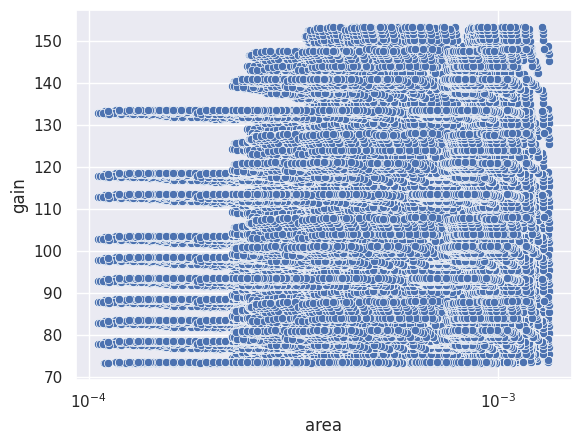

In [5]:
sns.scatterplot(data=test_df[test_df["gain"]>73.33], x="area", y="gain")
plt.xscale("log")

In [28]:
test_df.sort_values(by=["gain_1stage", "gain_2stage"], ascending=[False, True])

,Unnamed: 0,Ra_2stage,gma_2stage,Cin_2stage,Ra_1stage,gma_1stage,Cc,Rc,gain_OTA,W_diff,...,L_cs,vgs_cs,W_cc,L_cc,W_rc,L_rc,area,gain,gain_2stage,gain_1stage
16504,16504,1000000.0,0.000056,1.000000e-16,255761.197066,0.000452,1.000000e-13,1000.00000,6.497568e+03,0.000174,...,4.000000e-07,0.7,0.000008,0.000008,0.000001,5.000000e-07,0.000232,76.255016,35.0,41.255016
16864,16864,1000000.0,0.000056,1.000000e-16,255761.197066,0.000452,1.000000e-11,1000.00000,6.497568e+03,0.000174,...,4.000000e-07,0.7,0.000082,0.000082,0.000001,5.000000e-07,0.000378,76.255016,35.0,41.255016
17224,17224,1000000.0,0.000056,1.000000e-16,255761.197066,0.000452,1.000000e-09,1000.00000,6.497568e+03,0.000174,...,4.000000e-07,0.7,0.000816,0.000816,0.000001,5.000000e-07,0.001848,76.255016,35.0,41.255016
17584,17584,1000000.0,0.000056,1.000000e-16,255761.197066,0.000452,1.000000e-13,3162.27766,6.497568e+03,0.000174,...,4.000000e-07,0.7,0.000008,0.000008,0.000002,5.000000e-07,0.000232,76.255016,35.0,41.255016
17944,17944,1000000.0,0.000056,1.000000e-16,255761.197066,0.000452,1.000000e-11,3162.27766,6.497568e+03,0.000174,...,4.000000e-07,0.7,0.000082,0.000082,0.000002,5.000000e-07,0.000379,76.255016,35.0,41.255016
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
384717,384717,10000000.0,0.010000,1.000000e-11,89417.825568,0.000386,1.000000e-11,3162.27766,3.447505e+06,0.000036,...,3.200000e-06,0.7,0.000082,0.000082,0.000002,5.000000e-07,0.000361,130.750099,100.0,30.750099
385557,385557,10000000.0,0.010000,1.000000e-11,89417.825568,0.000386,1.000000e-09,3162.27766,3.447505e+06,0.000036,...,3.200000e-06,0.7,0.000816,0.000816,0.000002,5.000000e-07,0.001830,130.750099,100.0,30.750099
386397,386397,10000000.0,0.010000,1.000000e-11,89417.825568,0.000386,1.000000e-13,10000.00000,3.447505e+06,0.000036,...,3.200000e-06,0.7,0.000008,0.000008,0.000004,5.000000e-07,0.000215,130.750099,100.0,30.750099
387237,387237,10000000.0,0.010000,1.000000e-11,89417.825568,0.000386,1.000000e-11,10000.00000,3.447505e+06,0.000036,...,3.200000e-06,0.7,0.000082,0.000082,0.000004,5.000000e-07,0.000362,130.750099,100.0,30.750099
